In [1]:
#!pip install unidecode numpy cython

In [2]:
#!pip install -U biogeme

In [3]:
%load_ext autoreload
%autoreload 2
from IPython.display import clear_output
from utils_ML import *
from variables import *
clear_output(wait=False)

In [4]:
# matplotlib options
plt.style.use('ggplot')
%matplotlib inline
plt.rcParams['figure.figsize'] = (18, 12)

In [5]:
vSeq = []
biogemeSeq = []
bestResultPosition = []
ModNameSeqence = []
best = []
results = []

In [6]:
#Baseline MNL linear in variables

#Utility functions
TRAIN_SP = ASC_TRAIN                                      + \
     B_COST             * TRAIN_COST_SCALED + \
     B_TIME_TRAIN       * TRAIN_TT_SCALED   + \
     B_HE               * TRAIN_HE_SCALED           + \
     B_AGE_ADULTS_TRAIN * AGE_2                     + \
     B_AGE_3_TRAIN      * AGE_3                     + \
     B_AGE_ADULTS_TRAIN * AGE_4                     + \
     B_AGE_5_TRAIN      * AGE_5                     + \
     B_LUGGAGE_TRAIN    * LUGGAGE                   + \
     B_MALE_TRAIN       * MALE                      + \
     B_GA_TRAIN         * GA                        + \
     B_BUSINESS_TRAIN   * BUSINESS                  + \
     B_PRIVATE          * PRIVATE                   + \
     B_COMMUTER         * COMMUTER

SM_SP = ASC_SM                                   + \
     B_COST          * SM_COST_SCALED + \
     B_TIME_SM       * SM_TT_SCALED   + \
     B_HE            * SM_HE_SCALED           + \
     B_AGE_ADULTS_SM * AGE_2                  + \
     B_AGE_ADULTS_SM * AGE_3                  + \
     B_AGE_4_SM      * AGE_4                  + \
     B_AGE_5_SM      * AGE_5                  + \
     B_FIRST_SM      * FIRST                  + \
     B_BUSINESS_SM   * BUSINESS               + \
     B_PRIVATE       * PRIVATE                + \
     B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR                              + \
     B_COST     * CAR_COST_SCALED + \
     B_TIME_CAR * CAR_TT_SCALED



V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
bestRes = "ML_"+str(len(vSeq))
ModNameSeqence.append(bestRes)
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))


# ^^^^^^^^^^^

# ML_1

In [7]:
obsprob = exp(models.loglogit(V,av,CHOICE))

condprobIndiv = PanelLikelihoodTrajectory(obsprob)

logprob = log(condprobIndiv)

biogeme = bio.BIOGEME(database,logprob)
biogeme.modelName = ModNameSeqence[-1]

# Estimate the parameters
results.append(biogeme.estimate())

# Results model ML_1

                       Value   Std err     t-test       p-value
ASC_SM              0.304619  0.201316   1.513138  1.302447e-01
ASC_TRAIN           0.234458  0.238144   0.984522  3.248588e-01
B_AGE_3_TRAIN      -1.394528  0.204673  -6.813448  9.528600e-12
B_AGE_4_SM         -0.782662  0.191703  -4.082683  4.451878e-05
B_AGE_5_SM         -1.088111  0.209808  -5.186211  2.146158e-07
B_AGE_5_TRAIN      -0.118454  0.223156  -0.530814  5.955475e-01
B_AGE_ADULTS_SM    -0.530454  0.186447  -2.845073  4.440119e-03
B_AGE_TRAIN_ADULTS -1.264778  0.199140  -6.351199  2.136431e-10
B_BUSINESS_SM       0.533087  0.061520   8.665320  0.000000e+00
B_BUSINESS_TRAIN    0.911676  0.084840  10.745862  0.000000e+00
B_COMMUTER          1.842284  0.118499  15.546860  0.000000e+00
B_COST             -0.931891  0.038633 -24.121343  0.000000e+00
B_FIRST_SM          0.198419  0.048591   4.083441  4.437370e-05
B_GA_TRAIN          1.442985  0.073960  19.510273  0.000000e+00
B_HE               -0.730872  0.085658  

# Variance Covariance Matrix

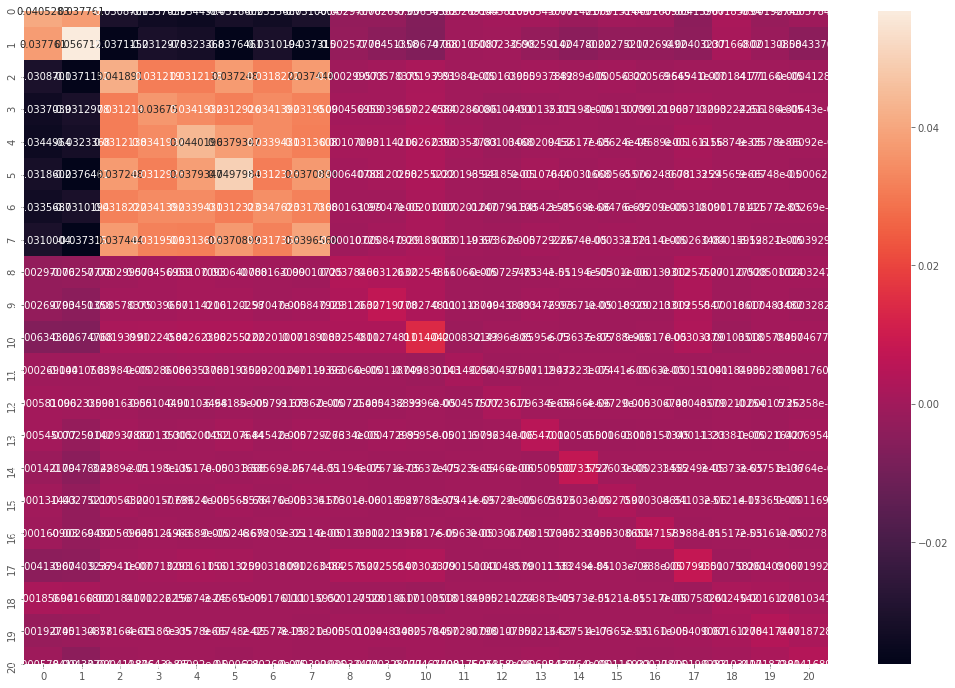

In [8]:
print_result(results, database)

In [9]:
#MNL NON linear in variables

#Utility functions
TRAIN_SP = ASC_TRAIN                                      + \
     B_COST             * TRAIN_COST_SCALED**q_COST + \
     B_TIME_TRAIN       * TRAIN_TT_SCALED**q_TIME   + \
     B_HE               * TRAIN_HE_SCALED**q_HE           + \
     B_AGE_ADULTS_TRAIN * AGE_2                     + \
     B_AGE_3_TRAIN      * AGE_3                     + \
     B_AGE_ADULTS_TRAIN * AGE_4                     + \
     B_AGE_5_TRAIN      * AGE_5                     + \
     B_LUGGAGE_TRAIN    * LUGGAGE                   + \
     B_MALE_TRAIN       * MALE                      + \
     B_GA_TRAIN         * GA                        + \
     B_BUSINESS_TRAIN   * BUSINESS                  + \
     B_PRIVATE          * PRIVATE                   + \
     B_COMMUTER         * COMMUTER

SM_SP = ASC_SM                                   + \
     B_COST          * SM_COST_SCALED**q_COST + \
     B_TIME_SM       * SM_TT_SCALED**q_TIME   + \
     B_HE            * SM_HE_SCALED**q_HE     + \
     B_AGE_ADULTS_SM * AGE_2                  + \
     B_AGE_ADULTS_SM * AGE_3                  + \
     B_AGE_4_SM      * AGE_4                  + \
     B_AGE_5_SM      * AGE_5                  + \
     B_FIRST_SM      * FIRST                  + \
     B_BUSINESS_SM   * BUSINESS               + \
     B_PRIVATE       * PRIVATE                + \
     B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR                              + \
     B_COST     * CAR_COST_SCALED**q_COST + \
     B_TIME_CAR * CAR_TT_SCALED**q_TIME



V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
#logProbSeq.append(logprob)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_2

## Estimate  ML_2 and compare with ML_1

#### Unrestricted model ML_2 and Restricted model ML_1

# Results model ML_2

                        Value   Std err     t-test       p-value
ASC_SM              -0.281367  0.444302  -0.633279  5.265514e-01
ASC_TRAIN            2.704545  0.992058   2.726197  6.406874e-03
B_AGE_3_TRAIN       -1.401061  0.210789  -6.646747  2.996425e-11
B_AGE_4_SM          -0.793966  0.197039  -4.029495  5.589676e-05
B_AGE_5_SM          -1.101588  0.214663  -5.131708  2.871254e-07
B_AGE_5_TRAIN       -0.161505  0.228974  -0.705340  4.805985e-01
B_AGE_ADULTS_SM     -0.531060  0.191897  -2.767423  5.650140e-03
B_AGE_TRAIN_ADULTS  -1.278052  0.205261  -6.226487  4.770087e-10
B_BUSINESS_SM        0.506869  0.061962   8.180356  2.220446e-16
B_BUSINESS_TRAIN     0.885607  0.085679  10.336293  0.000000e+00
B_COMMUTER           1.762416  0.122259  14.415417  0.000000e+00
B_COST              -2.176426  0.150673 -14.444709  0.000000e+00
B_FIRST_SM           0.219309  0.049175   4.459766  8.204900e-06
B_GA_TRAIN           1.433789  0.074707  19.192258  0.000000e+00
B_HE                -0.78

# Variance Covariance Matrix

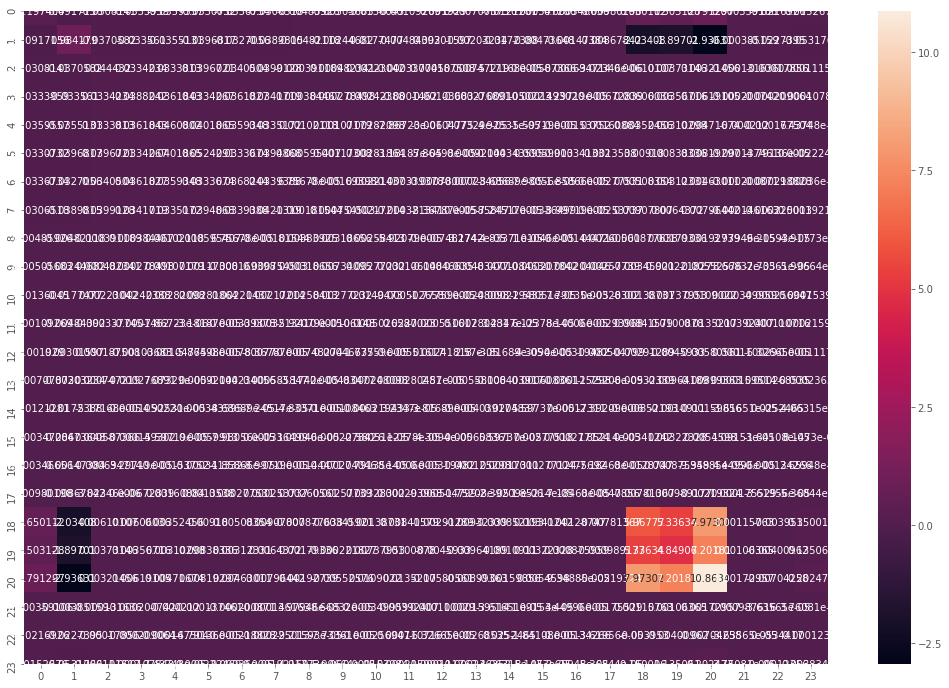

# Results model ML_1

                       Value   Std err     t-test       p-value
ASC_SM              0.304619  0.201316   1.513138  1.302447e-01
ASC_TRAIN           0.234458  0.238144   0.984522  3.248588e-01
B_AGE_3_TRAIN      -1.394528  0.204673  -6.813448  9.528600e-12
B_AGE_4_SM         -0.782662  0.191703  -4.082683  4.451878e-05
B_AGE_5_SM         -1.088111  0.209808  -5.186211  2.146158e-07
B_AGE_5_TRAIN      -0.118454  0.223156  -0.530814  5.955475e-01
B_AGE_ADULTS_SM    -0.530454  0.186447  -2.845073  4.440119e-03
B_AGE_TRAIN_ADULTS -1.264778  0.199140  -6.351199  2.136431e-10
B_BUSINESS_SM       0.533087  0.061520   8.665320  0.000000e+00
B_BUSINESS_TRAIN    0.911676  0.084840  10.745862  0.000000e+00
B_COMMUTER          1.842284  0.118499  15.546860  0.000000e+00
B_COST             -0.931891  0.038633 -24.121343  0.000000e+00
B_FIRST_SM          0.198419  0.048591   4.083441  4.437370e-05
B_GA_TRAIN          1.442985  0.073960  19.510273  0.000000e+00
B_HE               -0.730872  0.085658  

# Variance Covariance Matrix

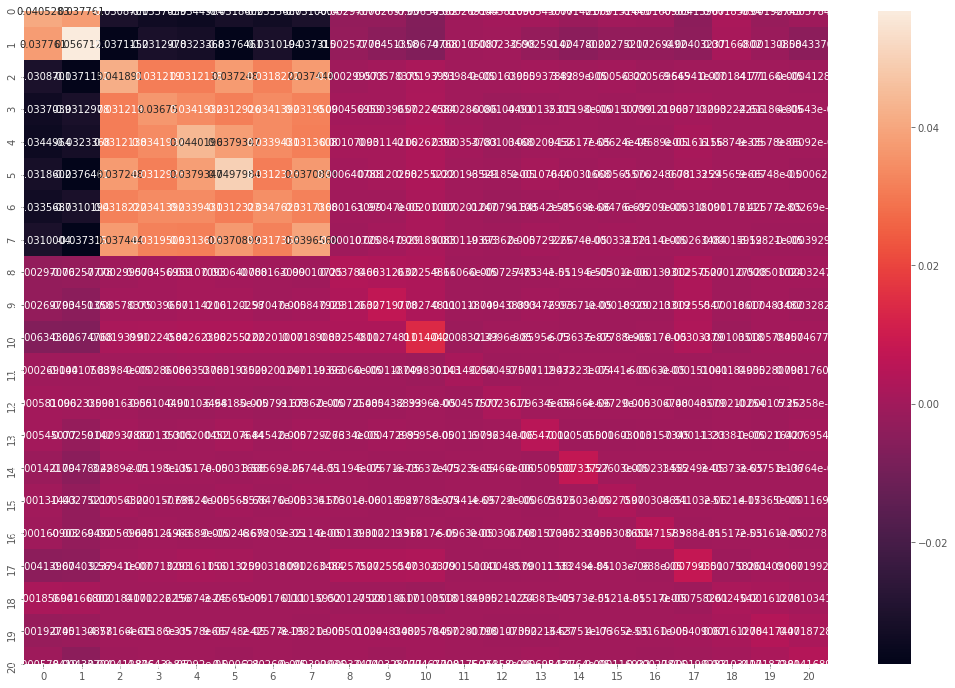

### Diff. LL(beta) ML_1 > ML_2 <- False

***************
***************


### Diff. rho bar square ML_1 > ML_2 <- False

***************
RatioTest 280.4327516425892
Critical 7.814727903251179
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 272.618023739338

### Probability that ML_2 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:3.0732245645018726e-66
Difference:-0.07


#### LogLikelihood ML_2 - BenAkivaSwaitHorowitzTest ML_2

# -----

# ML_3  NEXT MODEL

In [10]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=0
                               #,COST_SCALE_CAR=10000
                               #,COST_SCALE_PUB=100
                                     )
best.append(bestRes)

In [11]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + B_TIME_TRAIN       * TRAIN_TT_SCALED \
     + B_HE               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + B_TIME_SM       * SM_TT_SCALED   \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + B_TIME_CAR * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_3

## Estimate  ML_3 and compare with ML_2

#### Unrestricted model ML_2 and Restricted model ML_3

# Results model ML_2

                        Value   Std err     t-test       p-value
ASC_SM              -0.281367  0.444302  -0.633279  5.265514e-01
ASC_TRAIN            2.704545  0.992058   2.726197  6.406874e-03
B_AGE_3_TRAIN       -1.401061  0.210789  -6.646747  2.996425e-11
B_AGE_4_SM          -0.793966  0.197039  -4.029495  5.589676e-05
B_AGE_5_SM          -1.101588  0.214663  -5.131708  2.871254e-07
B_AGE_5_TRAIN       -0.161505  0.228974  -0.705340  4.805985e-01
B_AGE_ADULTS_SM     -0.531060  0.191897  -2.767423  5.650140e-03
B_AGE_TRAIN_ADULTS  -1.278052  0.205261  -6.226487  4.770087e-10
B_BUSINESS_SM        0.506869  0.061962   8.180356  2.220446e-16
B_BUSINESS_TRAIN     0.885607  0.085679  10.336293  0.000000e+00
B_COMMUTER           1.762416  0.122259  14.415417  0.000000e+00
B_COST              -2.176426  0.150673 -14.444709  0.000000e+00
B_FIRST_SM           0.219309  0.049175   4.459766  8.204900e-06
B_GA_TRAIN           1.433789  0.074707  19.192258  0.000000e+00
B_HE                -0.78

# Variance Covariance Matrix

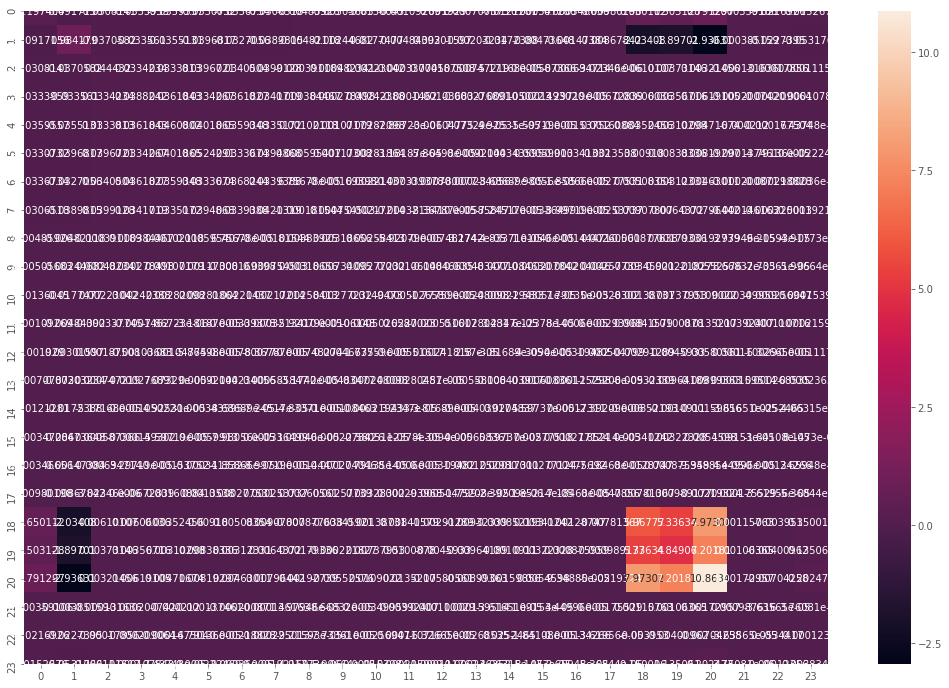

# Results model ML_3

                        Value   Std err     t-test       p-value
ASC_SM              -0.071570  0.324523  -0.220540  8.254504e-01
ASC_TRAIN           -0.496972  0.347841  -1.428736  1.530802e-01
BETA_COST_mean_Norm -3.363523  0.175142 -19.204510  0.000000e+00
BETA_COST_std_Norm   4.211951  0.193321  21.787348  0.000000e+00
B_AGE_3_TRAIN       -1.437681  0.308733  -4.656720  3.212872e-06
B_AGE_4_SM          -1.101996  0.307881  -3.579297  3.445204e-04
B_AGE_5_SM          -1.437120  0.329978  -4.355200  1.329454e-05
B_AGE_5_TRAIN       -0.298957  0.333146  -0.897377  3.695176e-01
B_AGE_ADULTS_SM     -0.750828  0.302423  -2.482709  1.303876e-02
B_AGE_TRAIN_ADULTS  -1.410104  0.304371  -4.632850  3.606660e-06
B_BUSINESS_SM        0.770984  0.091739   8.404091  0.000000e+00
B_BUSINESS_TRAIN     1.266983  0.109721  11.547358  0.000000e+00
B_COMMUTER           1.659866  0.172144   9.642298  0.000000e+00
B_FIRST_SM           0.369951  0.064380   5.746410  9.115830e-09
B_GA_TRAIN           1.82

# Variance Covariance Matrix

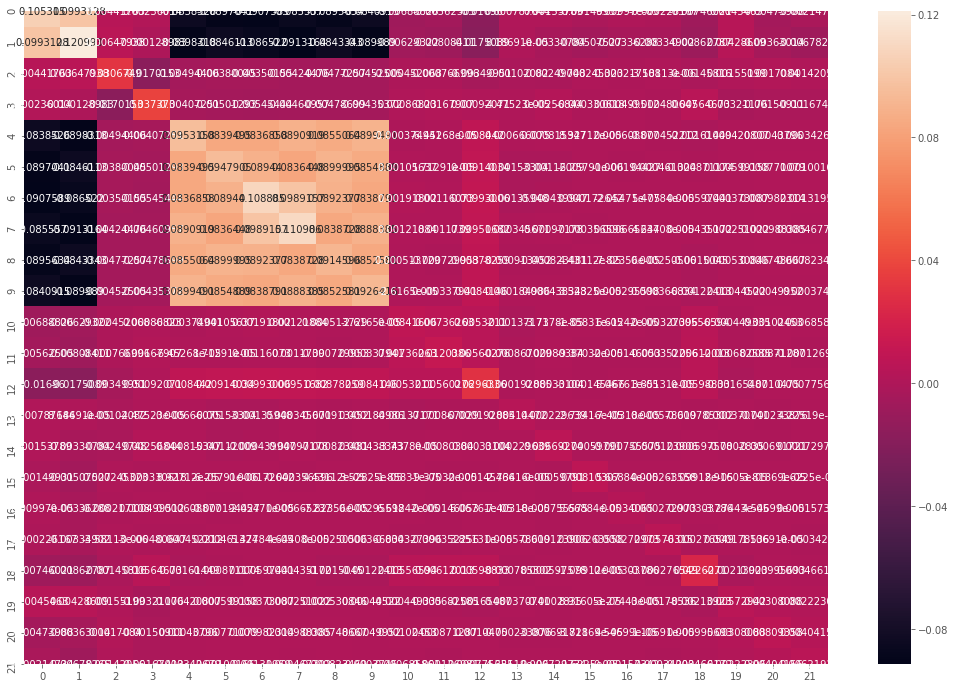

### Diff. LL(beta) ML_3 > ML_2 <- True

***************
***************


### Diff. rho bar square ML_3 > ML_2 <- True

***************
RatioTest 1369.470363724291
Critical 5.991464547107979
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 1363.478899177183

### Probability that ML_3 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:1.4503977801774563e-173
Difference:-0.07


#### LogLikelihood ML_2 - BenAkivaSwaitHorowitzTest ML_3

# -----

# ML_4  NEXT MODEL

In [12]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               , cross_validate=False
                                )
best.append(bestRes)

In [13]:
#Utility functions
TRAIN_SP = ASC_TRAIN                                      + \
     BETA_COST_random             * TRAIN_COST_SCALED + \
     B_TIME_TRAIN       * TRAIN_TT_SCALED   + \
     B_HE               * TRAIN_HE_SCALED           + \
     B_AGE_ADULTS_TRAIN * AGE_2                     + \
     B_AGE_3_TRAIN      * AGE_3                     + \
     B_AGE_ADULTS_TRAIN * AGE_4                     + \
     B_AGE_5_TRAIN      * AGE_5                     + \
     B_LUGGAGE_TRAIN    * LUGGAGE                   + \
     B_MALE_TRAIN       * MALE                      + \
     B_GA_TRAIN         * GA                        + \
     B_BUSINESS_TRAIN   * BUSINESS                  + \
     B_PRIVATE          * PRIVATE                   + \
     B_COMMUTER         * COMMUTER

SM_SP = ASC_SM                                   + \
     BETA_COST_random          * SM_COST_SCALED + \
     B_TIME_SM       * SM_TT_SCALED   + \
     B_HE            * SM_HE_SCALED           + \
     B_AGE_ADULTS_SM * AGE_2                  + \
     B_AGE_ADULTS_SM * AGE_3                  + \
     B_AGE_4_SM      * AGE_4                  + \
     B_AGE_5_SM      * AGE_5                  + \
     B_FIRST_SM      * FIRST                  + \
     B_BUSINESS_SM   * BUSINESS               + \
     B_PRIVATE       * PRIVATE                + \
     B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR                              + \
     BETA_COST_random     * CAR_COST_SCALED + \
     B_TIME_CAR * CAR_TT_SCALED



V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
#logProbSeq.append(logprob)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_4

## Estimate  ML_4 and compare with ML_3

#### Unrestricted model ML_4 and Restricted model ML_3

# Results model ML_4

                       Value        Std err         t-test  p-value
ASC_SM              0.149257  1.797693e+308  8.302696e-310      1.0
ASC_TRAIN          -0.649458  1.797693e+308 -3.612729e-309      1.0
BETA_COST_mean      0.576125  1.797693e+308  3.204804e-309      1.0
BETA_COST_std       1.869370  1.797693e+308  1.039871e-308      1.0
B_AGE_3_TRAIN      -1.441340  5.273843e-155 -2.732998e+154      0.0
B_AGE_4_SM         -0.963265   0.000000e+00  1.797693e+308      0.0
B_AGE_5_SM         -1.131162  2.636922e-155 -4.289707e+154      0.0
B_AGE_5_TRAIN      -0.105387  2.636922e-155 -3.996609e+153      0.0
B_AGE_ADULTS_SM    -0.702852  5.273843e-155 -1.332712e+154      0.0
B_AGE_TRAIN_ADULTS -1.435106  2.222759e-162 -6.456419e+161      0.0
B_BUSINESS_SM       0.736491  2.636922e-155  2.792996e+154      0.0
B_BUSINESS_TRAIN    1.249379  2.636922e-155  4.738020e+154      0.0
B_COMMUTER          1.874221  5.273843e-155  3.553806e+154      0.0
B_FIRST_SM          0.253172  1.797693e+308  1.4

# Variance Covariance Matrix

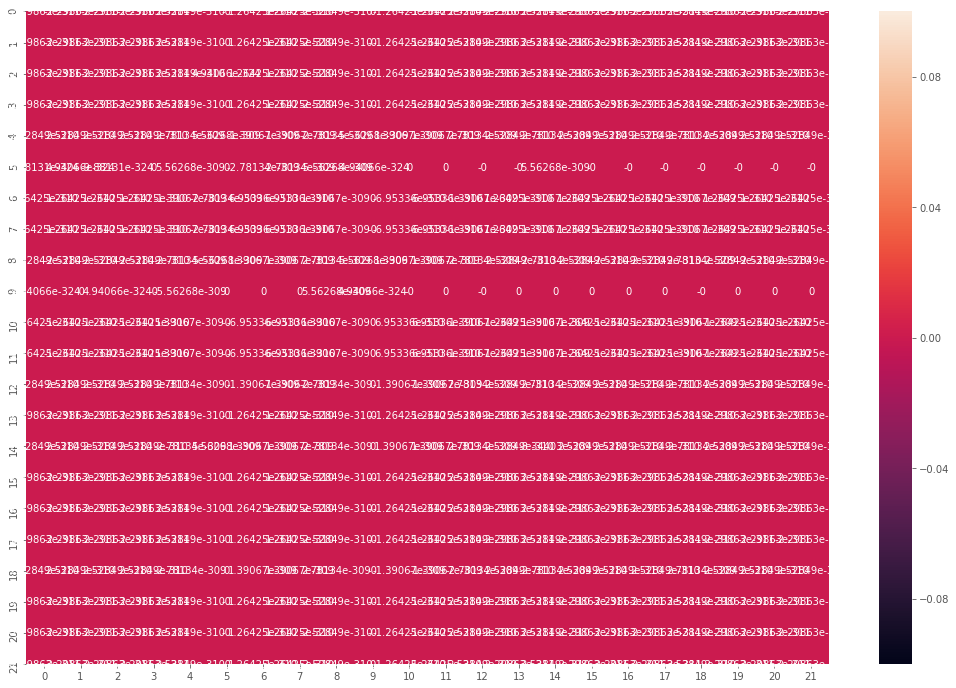

# Results model ML_3

                        Value   Std err     t-test       p-value
ASC_SM              -0.071570  0.324523  -0.220540  8.254504e-01
ASC_TRAIN           -0.496972  0.347841  -1.428736  1.530802e-01
BETA_COST_mean_Norm -3.363523  0.175142 -19.204510  0.000000e+00
BETA_COST_std_Norm   4.211951  0.193321  21.787348  0.000000e+00
B_AGE_3_TRAIN       -1.437681  0.308733  -4.656720  3.212872e-06
B_AGE_4_SM          -1.101996  0.307881  -3.579297  3.445204e-04
B_AGE_5_SM          -1.437120  0.329978  -4.355200  1.329454e-05
B_AGE_5_TRAIN       -0.298957  0.333146  -0.897377  3.695176e-01
B_AGE_ADULTS_SM     -0.750828  0.302423  -2.482709  1.303876e-02
B_AGE_TRAIN_ADULTS  -1.410104  0.304371  -4.632850  3.606660e-06
B_BUSINESS_SM        0.770984  0.091739   8.404091  0.000000e+00
B_BUSINESS_TRAIN     1.266983  0.109721  11.547358  0.000000e+00
B_COMMUTER           1.659866  0.172144   9.642298  0.000000e+00
B_FIRST_SM           0.369951  0.064380   5.746410  9.115830e-09
B_GA_TRAIN           1.82

# Variance Covariance Matrix

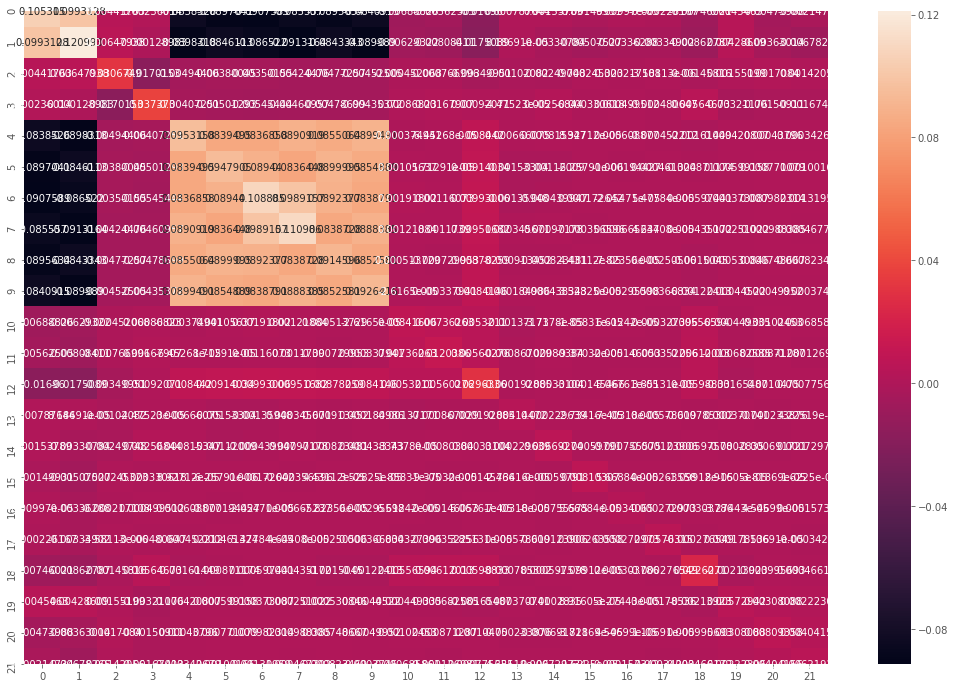

### Diff. LL(beta) ML_3 > ML_4 <- False

***************
***************


### Diff. rho bar square ML_3 > ML_4 <- False

***************
NON nested models:LogLikelihood ratio test NOT applicable
### Probability that ML_4 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:6.482939735690176e-68
Difference:-0.07


#### LogLikelihood None - BenAkivaSwaitHorowitzTest ML_4

## ML_4 is NOT identified

# -----

# ML_5  NEXT MODEL

In [14]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               , cross_validate=False)
best.append(bestRes)

In [15]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + BETA_TIME_TRAIN_random       * TRAIN_TT_SCALED \
     + B_HE               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + BETA_TIME_SM_random       * SM_TT_SCALED   \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + BETA_TIME_CAR_random * CAR_TT_SCALED
     
V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_5

## Estimate  ML_5 and compare with ML_3

#### Unrestricted model ML_5 and Restricted model ML_3

# Results model ML_5

                         Value   Std err     t-test       p-value
ASC_SM               -0.716877  0.626543  -1.144179  2.525492e-01
ASC_TRAIN             0.042034  0.700613   0.059996  9.521589e-01
BETA_COST_mean_Norm  -5.227126  0.271731 -19.236367  0.000000e+00
BETA_COST_std_Norm    3.949081  0.224620  17.581196  0.000000e+00
BETA_TIME_CAR_mean    1.574518  0.043725  36.009425  0.000000e+00
BETA_TIME_CAR_std     0.558283  0.030520  18.292189  0.000000e+00
BETA_TIME_SM_mean     1.385791  0.059812  23.169173  0.000000e+00
BETA_TIME_SM_std      0.384859  0.030231  12.730779  0.000000e+00
BETA_TIME_TRAIN_mean  1.657135  0.054211  30.568003  0.000000e+00
BETA_TIME_TRAIN_std   0.461952  0.029803  15.500452  0.000000e+00
B_AGE_3_TRAIN        -2.144671  0.582292  -3.683153  2.303666e-04
B_AGE_4_SM           -2.182763  0.557347  -3.916346  8.990131e-05
B_AGE_5_SM           -2.189896  0.678539  -3.227368  1.249347e-03
B_AGE_5_TRAIN         0.473067  0.777819   0.608197  5.430571e-01
B_AGE_ADUL

# Variance Covariance Matrix

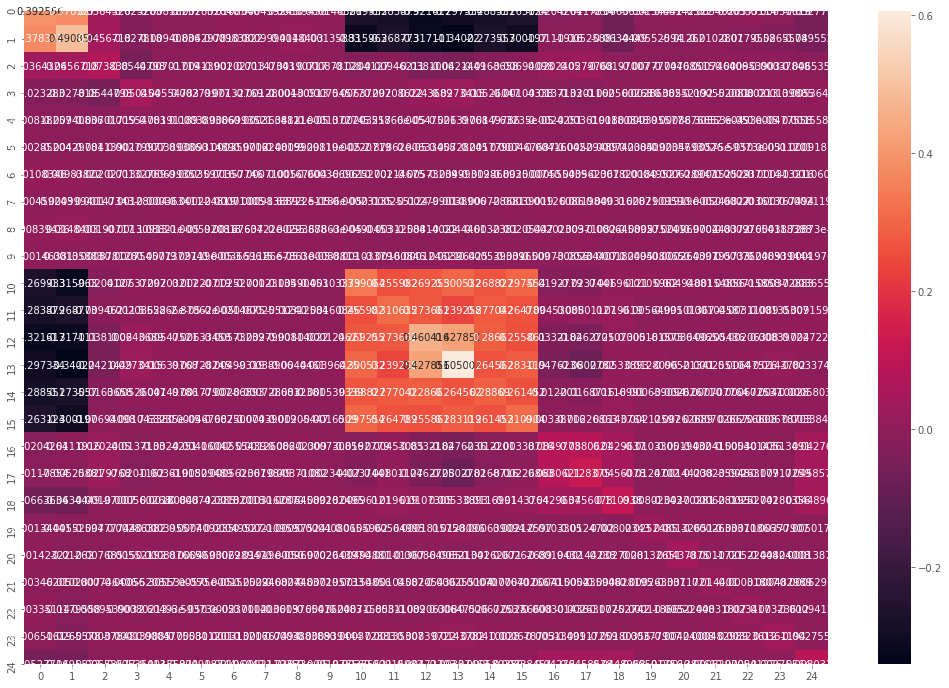

# Results model ML_3

                        Value   Std err     t-test       p-value
ASC_SM              -0.071570  0.324523  -0.220540  8.254504e-01
ASC_TRAIN           -0.496972  0.347841  -1.428736  1.530802e-01
BETA_COST_mean_Norm -3.363523  0.175142 -19.204510  0.000000e+00
BETA_COST_std_Norm   4.211951  0.193321  21.787348  0.000000e+00
B_AGE_3_TRAIN       -1.437681  0.308733  -4.656720  3.212872e-06
B_AGE_4_SM          -1.101996  0.307881  -3.579297  3.445204e-04
B_AGE_5_SM          -1.437120  0.329978  -4.355200  1.329454e-05
B_AGE_5_TRAIN       -0.298957  0.333146  -0.897377  3.695176e-01
B_AGE_ADULTS_SM     -0.750828  0.302423  -2.482709  1.303876e-02
B_AGE_TRAIN_ADULTS  -1.410104  0.304371  -4.632850  3.606660e-06
B_BUSINESS_SM        0.770984  0.091739   8.404091  0.000000e+00
B_BUSINESS_TRAIN     1.266983  0.109721  11.547358  0.000000e+00
B_COMMUTER           1.659866  0.172144   9.642298  0.000000e+00
B_FIRST_SM           0.369951  0.064380   5.746410  9.115830e-09
B_GA_TRAIN           1.82

# Variance Covariance Matrix

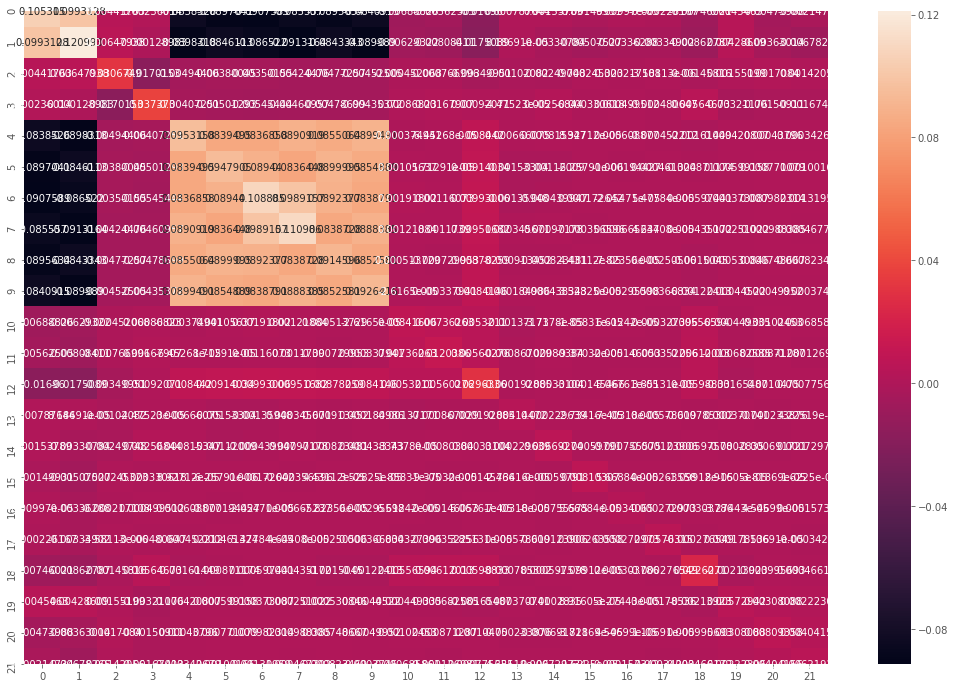

### Diff. LL(beta) ML_3 > ML_5 <- False

***************
***************


### Diff. rho bar square ML_3 > ML_5 <- True

***************
RatioTest 2306.3510490544777
Critical 7.814727903251179
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 2298.5363211512267

### Probability that ML_3 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:0.0
Difference:-0.07


#### LogLikelihood ML_5 - BenAkivaSwaitHorowitzTest ML_3

#### LogLikelihood TEST ML_5 disagrees with BenAkivaSwaitHorowitzTest ML_3

### TRY  CROSS VALIDATION

# Perform  Cross Validation Between ['ML_5', 'ML_3']

Model 0
Fold 0
Model 0
Fold 1
Model 0
Fold 2
Model 0
Fold 3
Model 0
Fold 4
Model 1
Fold 0
Model 1
Fold 1
Model 1
Fold 2
Model 1
Fold 3
Model 1
Fold 4
loglikelihood model ML_3: -1545.8083254880025 +/- 26.191383308333666
loglikelihood model ML_5: -1562.2951374304955 +/- 24.958107547611007


## Accept ML_3 performs better off the sample

# -----

# ML_6  NEXT MODEL

In [16]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [17]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED \
     + B_HE               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + BETA_TIME_SM_random_Norm       * SM_TT_SCALED   \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + BETA_TIME_CAR_random_Norm * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_6

## Estimate  ML_6 and compare with ML_3

#### Unrestricted model ML_6 and Restricted model ML_3

# Results model ML_6

                              Value   Std err     t-test   p-value
ASC_SM                    -0.707073  0.561635  -1.258956  0.208046
ASC_TRAIN                 -0.498284  0.625797  -0.796238  0.425893
BETA_COST_mean_Norm       -4.846182  0.217689 -22.261957  0.000000
BETA_COST_std_Norm         3.939660  0.212818  18.511877  0.000000
BETA_TIME_CAR_mean_Norm   -5.019774  0.206145 -24.350732  0.000000
BETA_TIME_CAR_std_Norm     2.355856  0.100737  23.386152  0.000000
BETA_TIME_SM_mean_Norm    -4.447921  0.220865 -20.138601  0.000000
BETA_TIME_SM_std_Norm      1.752247  0.124620  14.060746  0.000000
BETA_TIME_TRAIN_mean_Norm -5.080305  0.202257 -25.118015  0.000000
BETA_TIME_TRAIN_std_Norm   1.856112  0.097976  18.944461  0.000000
B_AGE_3_TRAIN             -2.073218  0.536841  -3.861888  0.000113
B_AGE_4_SM                -2.040285  0.523683  -3.896034  0.000098
B_AGE_5_SM                -1.361218  0.663932  -2.050237  0.040341
B_AGE_5_TRAIN              1.057305  0.711874   1.485242  0.13

# Variance Covariance Matrix

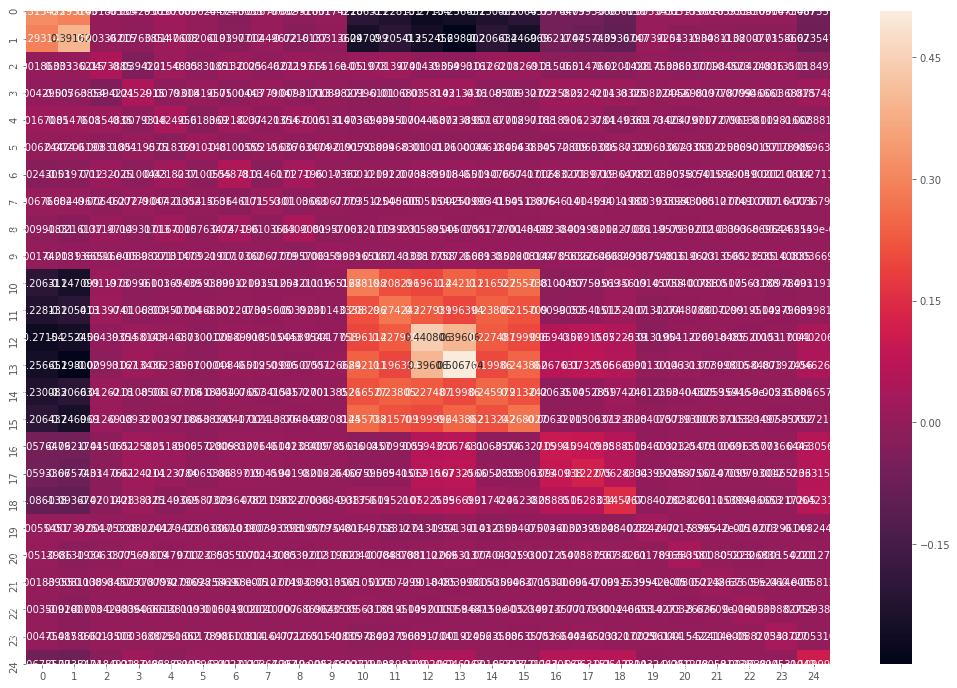

# Results model ML_3

                        Value   Std err     t-test       p-value
ASC_SM              -0.071570  0.324523  -0.220540  8.254504e-01
ASC_TRAIN           -0.496972  0.347841  -1.428736  1.530802e-01
BETA_COST_mean_Norm -3.363523  0.175142 -19.204510  0.000000e+00
BETA_COST_std_Norm   4.211951  0.193321  21.787348  0.000000e+00
B_AGE_3_TRAIN       -1.437681  0.308733  -4.656720  3.212872e-06
B_AGE_4_SM          -1.101996  0.307881  -3.579297  3.445204e-04
B_AGE_5_SM          -1.437120  0.329978  -4.355200  1.329454e-05
B_AGE_5_TRAIN       -0.298957  0.333146  -0.897377  3.695176e-01
B_AGE_ADULTS_SM     -0.750828  0.302423  -2.482709  1.303876e-02
B_AGE_TRAIN_ADULTS  -1.410104  0.304371  -4.632850  3.606660e-06
B_BUSINESS_SM        0.770984  0.091739   8.404091  0.000000e+00
B_BUSINESS_TRAIN     1.266983  0.109721  11.547358  0.000000e+00
B_COMMUTER           1.659866  0.172144   9.642298  0.000000e+00
B_FIRST_SM           0.369951  0.064380   5.746410  9.115830e-09
B_GA_TRAIN           1.82

# Variance Covariance Matrix

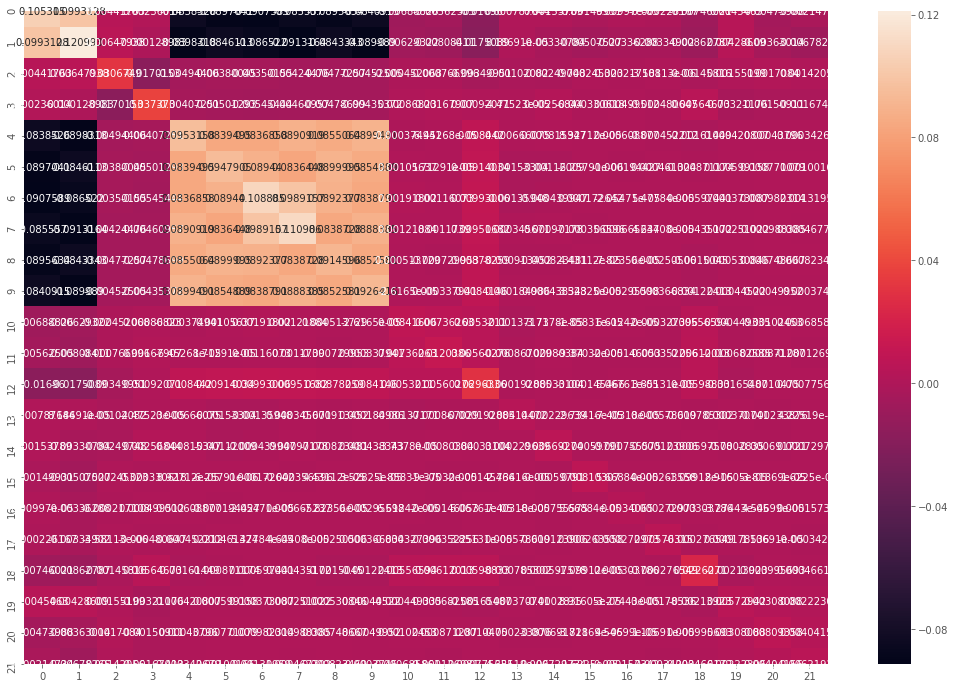

### Diff. LL(beta) ML_3 > ML_6 <- False

***************
***************


### Diff. rho bar square ML_3 > ML_6 <- True

***************
RatioTest 2305.3556424625876
Critical 7.814727903251179
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 2297.5409145593367

### Probability that ML_3 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:5.603579760107551e-280
Difference:-0.07


#### LogLikelihood ML_6 - BenAkivaSwaitHorowitzTest ML_3

#### LogLikelihood TEST ML_6 disagrees with BenAkivaSwaitHorowitzTest ML_3

### TRY  CROSS VALIDATION

# Perform  Cross Validation Between ['ML_6', 'ML_3']

Model 0
Fold 0
Model 0
Fold 1
Model 0
Fold 2
Model 0
Fold 3
Model 0
Fold 4
Model 1
Fold 0
Model 1
Fold 1
Model 1
Fold 2
Model 1
Fold 3
Model 1
Fold 4
loglikelihood model ML_3: -1544.7836628017026 +/- 26.134100552964274
loglikelihood model ML_6: -1565.6611923210896 +/- 18.244578084108188


## Accept ML_3 performs better off the sample

# -----

# ML_7  NEXT MODEL

In [18]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [19]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + BETA_TIME_SM_random_Norm       * SM_TT_SCALED   \
     + BETA_HE_random_Norm            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + BETA_TIME_CAR_random_Norm * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_7

## Estimate  ML_7 and compare with ML_3

#### Unrestricted model ML_7 and Restricted model ML_3

# Results model ML_7

                              Value   Std err     t-test       p-value
ASC_SM                    -0.961935  0.560053  -1.717577  8.587389e-02
ASC_TRAIN                 -0.084896  0.627043  -0.135391  8.923025e-01
BETA_COST_mean_Norm       -5.150510  0.236946 -21.737058  0.000000e+00
BETA_COST_std_Norm         3.858318  0.203325  18.976084  0.000000e+00
BETA_HE_mean_Norm         -1.439103  0.157393  -9.143349  0.000000e+00
BETA_HE_std_Norm           1.461876  0.185190   7.893919  2.886580e-15
BETA_TIME_CAR_mean_Norm   -5.096594  0.197153 -25.851012  0.000000e+00
BETA_TIME_CAR_std_Norm     2.303081  0.093666  24.588113  0.000000e+00
BETA_TIME_SM_mean_Norm    -4.792540  0.221020 -21.683747  0.000000e+00
BETA_TIME_SM_std_Norm      1.936153  0.107690  17.978974  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -5.094223  0.215174 -23.674917  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.595756  0.078662  20.286213  0.000000e+00
B_AGE_3_TRAIN             -1.950549  0.529772  -3.681863  2.315362e-04
B_AGE_

# Variance Covariance Matrix

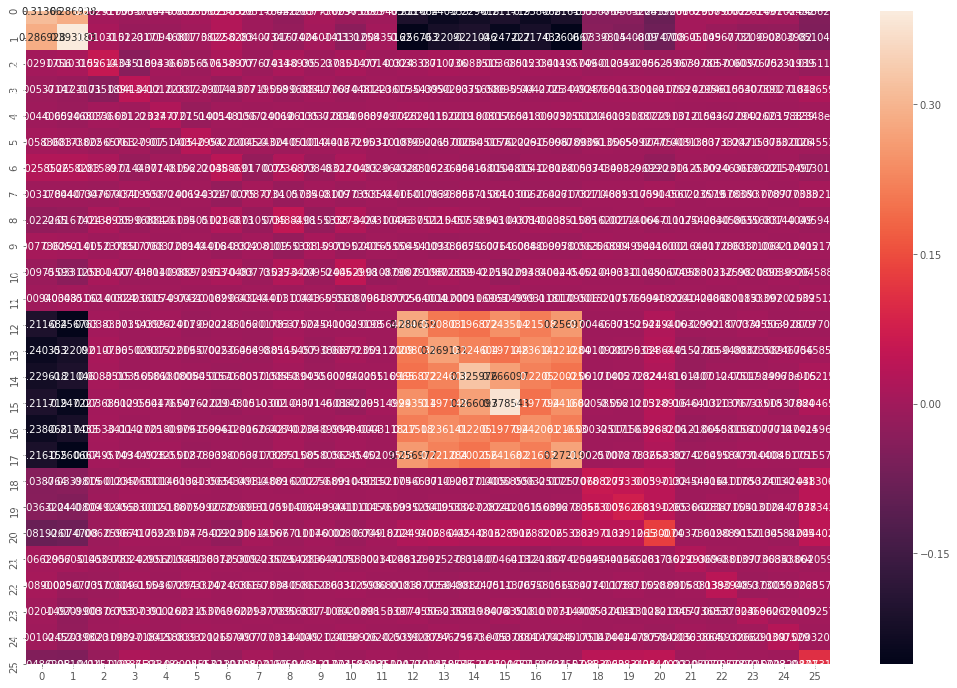

# Results model ML_3

                        Value   Std err     t-test       p-value
ASC_SM              -0.071570  0.324523  -0.220540  8.254504e-01
ASC_TRAIN           -0.496972  0.347841  -1.428736  1.530802e-01
BETA_COST_mean_Norm -3.363523  0.175142 -19.204510  0.000000e+00
BETA_COST_std_Norm   4.211951  0.193321  21.787348  0.000000e+00
B_AGE_3_TRAIN       -1.437681  0.308733  -4.656720  3.212872e-06
B_AGE_4_SM          -1.101996  0.307881  -3.579297  3.445204e-04
B_AGE_5_SM          -1.437120  0.329978  -4.355200  1.329454e-05
B_AGE_5_TRAIN       -0.298957  0.333146  -0.897377  3.695176e-01
B_AGE_ADULTS_SM     -0.750828  0.302423  -2.482709  1.303876e-02
B_AGE_TRAIN_ADULTS  -1.410104  0.304371  -4.632850  3.606660e-06
B_BUSINESS_SM        0.770984  0.091739   8.404091  0.000000e+00
B_BUSINESS_TRAIN     1.266983  0.109721  11.547358  0.000000e+00
B_COMMUTER           1.659866  0.172144   9.642298  0.000000e+00
B_FIRST_SM           0.369951  0.064380   5.746410  9.115830e-09
B_GA_TRAIN           1.82

# Variance Covariance Matrix

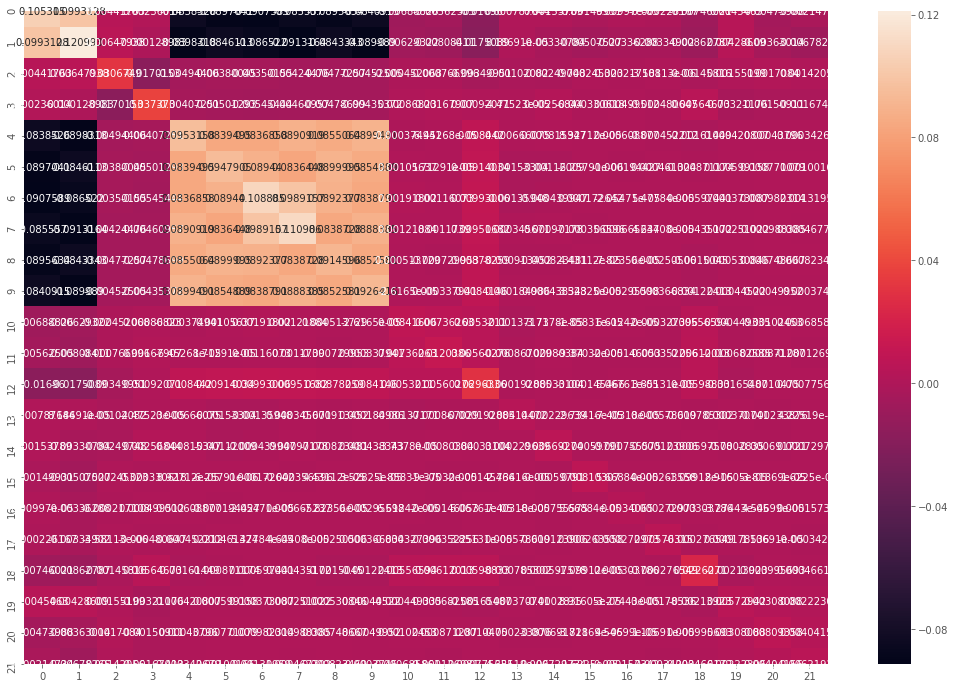

### Diff. LL(beta) ML_3 > ML_7 <- False

***************
***************


### Diff. rho bar square ML_3 > ML_7 <- True

***************
RatioTest 2314.255662441925
Critical 9.487729036781154
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 2304.7679334051436

### Probability that ML_3 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:6.432431919627666e-294
Difference:-0.07


#### LogLikelihood ML_7 - BenAkivaSwaitHorowitzTest ML_3

#### LogLikelihood TEST ML_7 disagrees with BenAkivaSwaitHorowitzTest ML_3

### TRY  CROSS VALIDATION

# Perform  Cross Validation Between ['ML_7', 'ML_3']

Model 0
Fold 0
Model 0
Fold 1
Model 0
Fold 2
Model 0
Fold 3
Model 0
Fold 4
Model 1
Fold 0
Model 1
Fold 1
Model 1
Fold 2
Model 1
Fold 3
Model 1
Fold 4
loglikelihood model ML_3: -1546.3666167161718 +/- 24.900738299607305
loglikelihood model ML_7: -1560.4422827714718 +/- 36.08771657616669


## Accept ML_3 performs better off the sample

# -----

# ML_8  NEXT MODEL

In [20]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [21]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + B_TIME_TRAIN       * TRAIN_TT_SCALED \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + B_TIME_SM       * SM_TT_SCALED   \
     + BETA_HE_random_Norm            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + B_TIME_CAR * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_8

## Estimate  ML_8 and compare with ML_3

#### Unrestricted model ML_8 and Restricted model ML_3

# Results model ML_8

                        Value   Std err     t-test       p-value
ASC_SM               0.042078  0.359632   0.117004  9.068567e-01
ASC_TRAIN            0.039557  0.426466   0.092756  9.260976e-01
BETA_COST_mean_Norm -3.177918  0.141948 -22.387946  0.000000e+00
BETA_COST_std_Norm   4.050084  0.191200  21.182452  0.000000e+00
BETA_HE_mean_Norm   -3.538948  0.236097 -14.989365  0.000000e+00
BETA_HE_std_Norm     4.277629  0.215547  19.845445  0.000000e+00
B_AGE_3_TRAIN       -1.441867  0.374621  -3.848868  1.186648e-04
B_AGE_4_SM          -0.996769  0.339320  -2.937549  3.308175e-03
B_AGE_5_SM          -1.203680  0.372016  -3.235561  1.214039e-03
B_AGE_5_TRAIN       -0.226817  0.430732  -0.526585  5.984815e-01
B_AGE_ADULTS_SM     -0.686367  0.330865  -2.074465  3.803612e-02
B_AGE_TRAIN_ADULTS  -1.416954  0.368509  -3.845098  1.205041e-04
B_BUSINESS_SM        0.979472  0.117211   8.356466  0.000000e+00
B_BUSINESS_TRAIN     1.267338  0.161727   7.836281  4.662937e-15
B_COMMUTER           1.85

# Variance Covariance Matrix

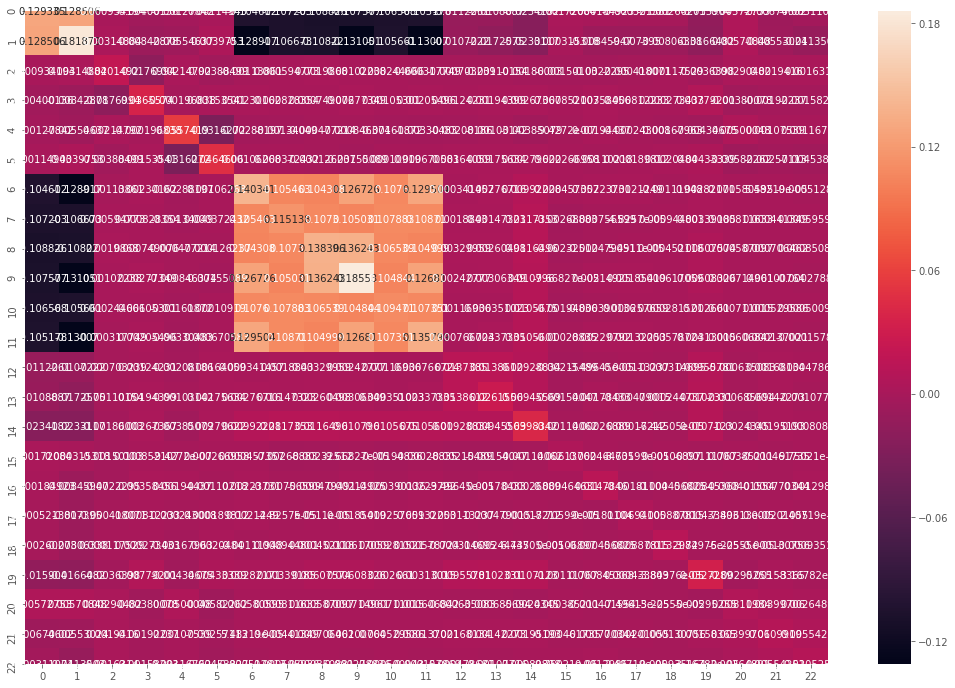

# Results model ML_3

                        Value   Std err     t-test       p-value
ASC_SM              -0.071570  0.324523  -0.220540  8.254504e-01
ASC_TRAIN           -0.496972  0.347841  -1.428736  1.530802e-01
BETA_COST_mean_Norm -3.363523  0.175142 -19.204510  0.000000e+00
BETA_COST_std_Norm   4.211951  0.193321  21.787348  0.000000e+00
B_AGE_3_TRAIN       -1.437681  0.308733  -4.656720  3.212872e-06
B_AGE_4_SM          -1.101996  0.307881  -3.579297  3.445204e-04
B_AGE_5_SM          -1.437120  0.329978  -4.355200  1.329454e-05
B_AGE_5_TRAIN       -0.298957  0.333146  -0.897377  3.695176e-01
B_AGE_ADULTS_SM     -0.750828  0.302423  -2.482709  1.303876e-02
B_AGE_TRAIN_ADULTS  -1.410104  0.304371  -4.632850  3.606660e-06
B_BUSINESS_SM        0.770984  0.091739   8.404091  0.000000e+00
B_BUSINESS_TRAIN     1.266983  0.109721  11.547358  0.000000e+00
B_COMMUTER           1.659866  0.172144   9.642298  0.000000e+00
B_FIRST_SM           0.369951  0.064380   5.746410  9.115830e-09
B_GA_TRAIN           1.82

# Variance Covariance Matrix

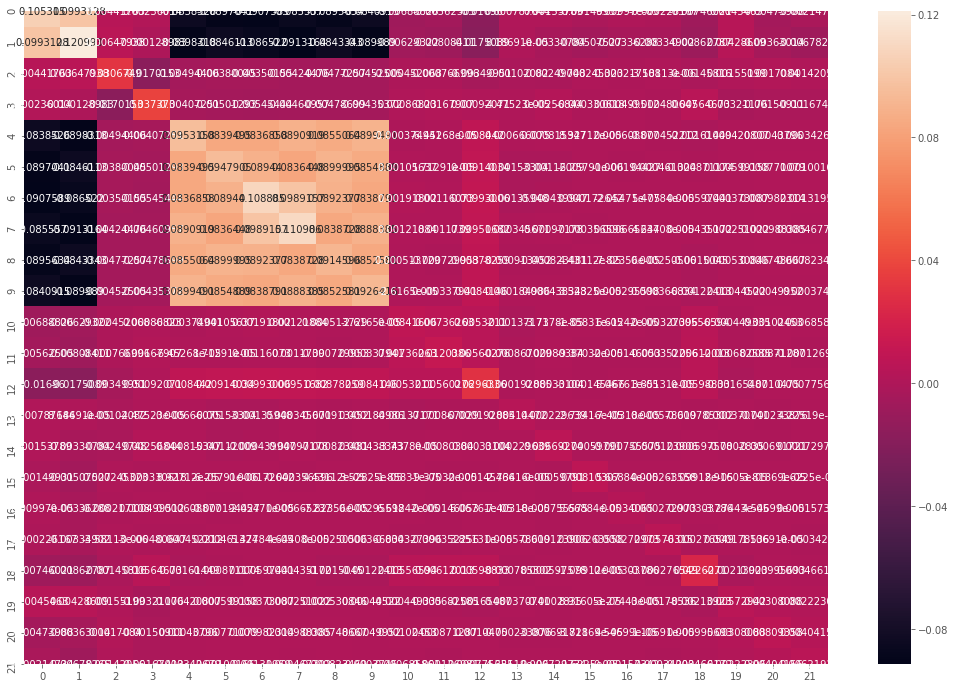

### Diff. LL(beta) ML_3 > ML_8 <- False

***************
***************


### Diff. rho bar square ML_3 > ML_8 <- False

***************
RatioTest 777.975866945173
Critical 3.841458820694124
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 774.1344081244789

### Probability that ML_8 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:1.0079105474157773e-47
Difference:-0.07


#### LogLikelihood ML_8 - BenAkivaSwaitHorowitzTest ML_8

# -----

# ML_9  NEXT MODEL

In [22]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [23]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED \
     + B_HE               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + B_TIME_SM       * SM_TT_SCALED   \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + B_TIME_CAR * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_9

## Estimate  ML_9 and compare with ML_8

#### Unrestricted model ML_9 and Restricted model ML_8

# Results model ML_9

                              Value   Std err     t-test       p-value
ASC_SM                    -0.081801  0.323254  -0.253056  8.002253e-01
ASC_TRAIN                  0.912602  0.467984   1.950071  5.116760e-02
BETA_COST_mean_Norm       -2.729903  0.135707 -20.116117  0.000000e+00
BETA_COST_std_Norm         4.147378  0.201506  20.581932  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -3.693794  0.205705 -17.956729  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.892784  0.123109  15.374911  0.000000e+00
B_AGE_3_TRAIN             -1.580154  0.394463  -4.005836  6.179843e-05
B_AGE_4_SM                -1.016761  0.308888  -3.291680  9.959077e-04
B_AGE_5_SM                -1.294031  0.334472  -3.868878  1.093371e-04
B_AGE_5_TRAIN              0.579410  0.499487   1.160010  2.460449e-01
B_AGE_ADULTS_SM           -0.755883  0.300334  -2.516806  1.184241e-02
B_AGE_TRAIN_ADULTS        -1.487002  0.371159  -4.006378  6.165701e-05
B_BUSINESS_SM              0.809625  0.097284   8.322254  0.000000e+00
B_BUSI

# Variance Covariance Matrix

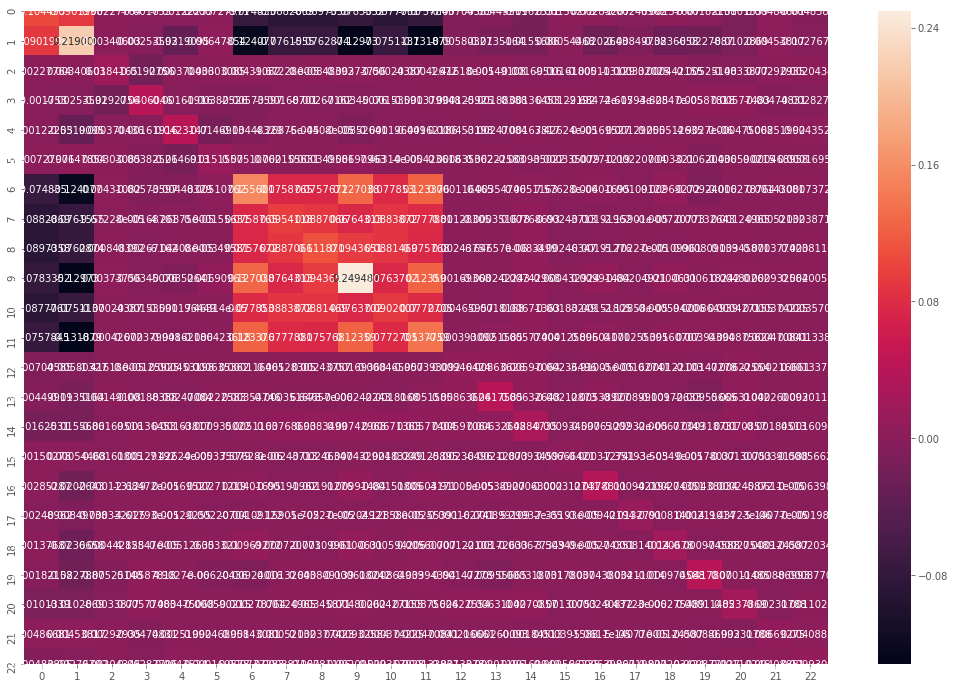

# Results model ML_8

                        Value   Std err     t-test       p-value
ASC_SM               0.042078  0.359632   0.117004  9.068567e-01
ASC_TRAIN            0.039557  0.426466   0.092756  9.260976e-01
BETA_COST_mean_Norm -3.177918  0.141948 -22.387946  0.000000e+00
BETA_COST_std_Norm   4.050084  0.191200  21.182452  0.000000e+00
BETA_HE_mean_Norm   -3.538948  0.236097 -14.989365  0.000000e+00
BETA_HE_std_Norm     4.277629  0.215547  19.845445  0.000000e+00
B_AGE_3_TRAIN       -1.441867  0.374621  -3.848868  1.186648e-04
B_AGE_4_SM          -0.996769  0.339320  -2.937549  3.308175e-03
B_AGE_5_SM          -1.203680  0.372016  -3.235561  1.214039e-03
B_AGE_5_TRAIN       -0.226817  0.430732  -0.526585  5.984815e-01
B_AGE_ADULTS_SM     -0.686367  0.330865  -2.074465  3.803612e-02
B_AGE_TRAIN_ADULTS  -1.416954  0.368509  -3.845098  1.205041e-04
B_BUSINESS_SM        0.979472  0.117211   8.356466  0.000000e+00
B_BUSINESS_TRAIN     1.267338  0.161727   7.836281  4.662937e-15
B_COMMUTER           1.85

# Variance Covariance Matrix

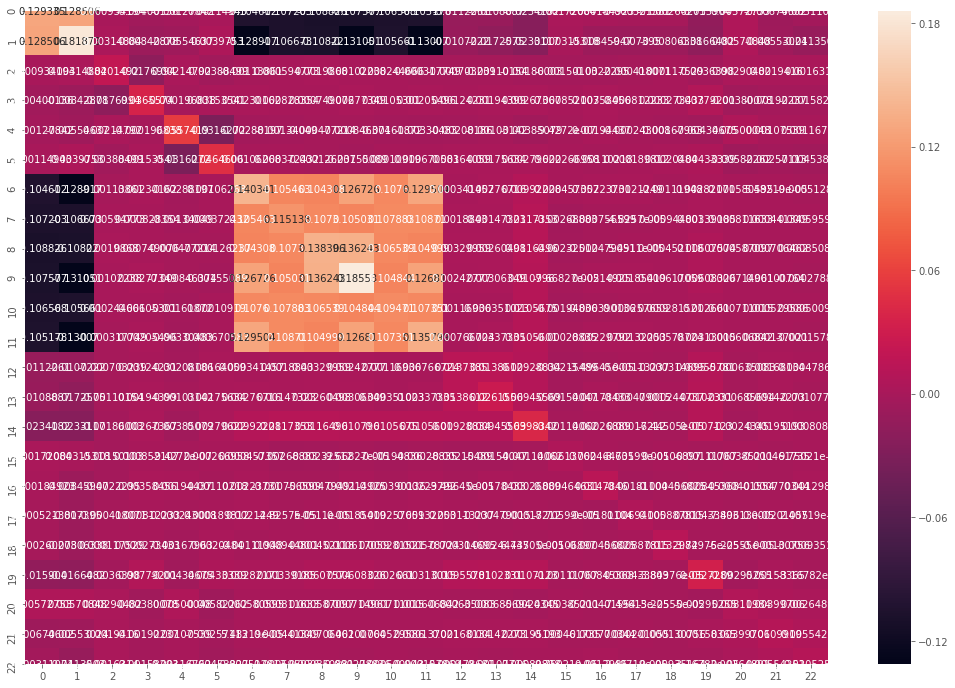

### Diff. LL(beta) ML_8 > ML_9 <- False

***************
***************


### Diff. rho bar square ML_8 > ML_9 <- True

***************
NON nested models:LogLikelihood ratio test NOT applicable
### Probability that ML_8 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:0.0
Difference:-0.07


#### LogLikelihood None - BenAkivaSwaitHorowitzTest ML_8

#### LogLikelihood TEST None disagrees with BenAkivaSwaitHorowitzTest ML_8

### TRY  CROSS VALIDATION

# Perform  Cross Validation Between ['ML_9', 'ML_8']

Model 0
Fold 0
Model 0
Fold 1
Model 0
Fold 2
Model 0
Fold 3
Model 0
Fold 4
Model 1
Fold 0
Model 1
Fold 1
Model 1
Fold 2
Model 1
Fold 3
Model 1
Fold 4
loglikelihood model ML_9: -1573.9173127105992 +/- 40.560004876180926
loglikelihood model ML_8: -1576.5387022479288 +/- 34.71929914071115


## Accept ML_9 performs better off the sample

# -----

# ML_10  NEXT MODEL

In [24]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [25]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + B_TIME_SM       * SM_TT_SCALED   \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + B_TIME_CAR * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_10

## Estimate  ML_10 and compare with ML_9

#### Unrestricted model ML_10 and Restricted model ML_9

# Results model ML_10

                              Value   Std err     t-test       p-value
ASC_SM                    -0.060972  0.335576  -0.181692  8.558243e-01
ASC_TRAIN                  1.314147  0.483647   2.717161  6.584457e-03
BETA_COST_mean_Norm       -3.392497  0.155292 -21.845930  0.000000e+00
BETA_COST_std_Norm         3.863550  0.169978  22.729671  0.000000e+00
BETA_HE_mean_Norm         -1.822418  0.221862  -8.214200  2.220446e-16
BETA_HE_std_Norm           1.993630  0.220888   9.025515  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -3.298232  0.204042 -16.164446  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.386131  0.089998  15.401822  0.000000e+00
B_AGE_3_TRAIN             -1.867957  0.437057  -4.273943  1.920459e-05
B_AGE_4_SM                -0.975123  0.316740  -3.078620  2.079619e-03
B_AGE_5_SM                -1.233501  0.341480  -3.612214  3.035935e-04
B_AGE_5_TRAIN              0.194177  0.528051   0.367724  7.130790e-01
B_AGE_ADULTS_SM           -0.717587  0.308693  -2.324598  2.009347e-02
B_AGE_

# Variance Covariance Matrix

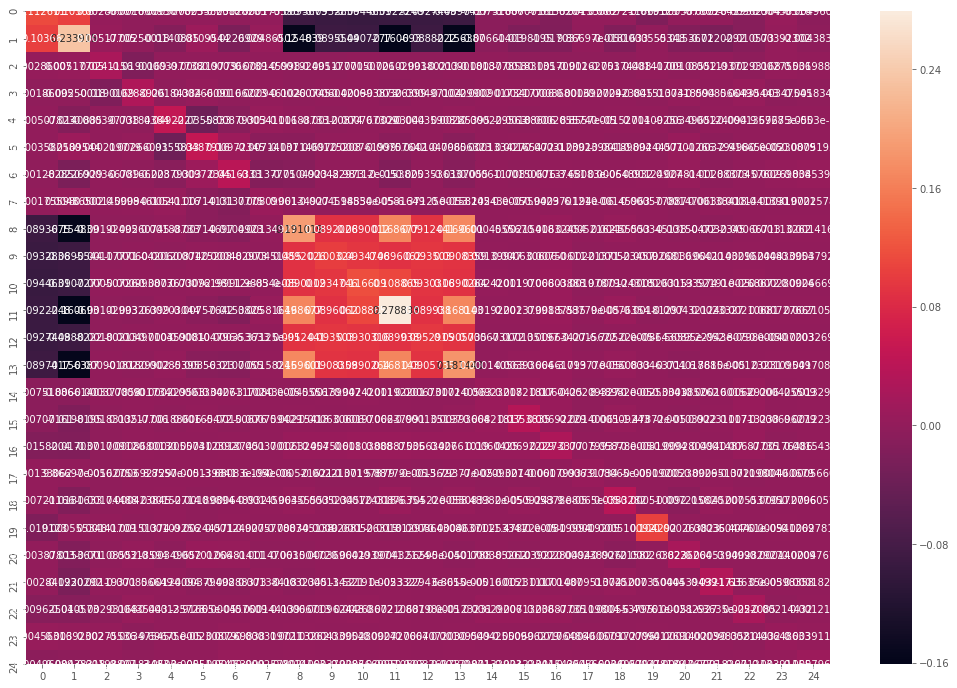

# Results model ML_9

                              Value   Std err     t-test       p-value
ASC_SM                    -0.081801  0.323254  -0.253056  8.002253e-01
ASC_TRAIN                  0.912602  0.467984   1.950071  5.116760e-02
BETA_COST_mean_Norm       -2.729903  0.135707 -20.116117  0.000000e+00
BETA_COST_std_Norm         4.147378  0.201506  20.581932  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -3.693794  0.205705 -17.956729  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.892784  0.123109  15.374911  0.000000e+00
B_AGE_3_TRAIN             -1.580154  0.394463  -4.005836  6.179843e-05
B_AGE_4_SM                -1.016761  0.308888  -3.291680  9.959077e-04
B_AGE_5_SM                -1.294031  0.334472  -3.868878  1.093371e-04
B_AGE_5_TRAIN              0.579410  0.499487   1.160010  2.460449e-01
B_AGE_ADULTS_SM           -0.755883  0.300334  -2.516806  1.184241e-02
B_AGE_TRAIN_ADULTS        -1.487002  0.371159  -4.006378  6.165701e-05
B_BUSINESS_SM              0.809625  0.097284   8.322254  0.000000e+00
B_BUSI

# Variance Covariance Matrix

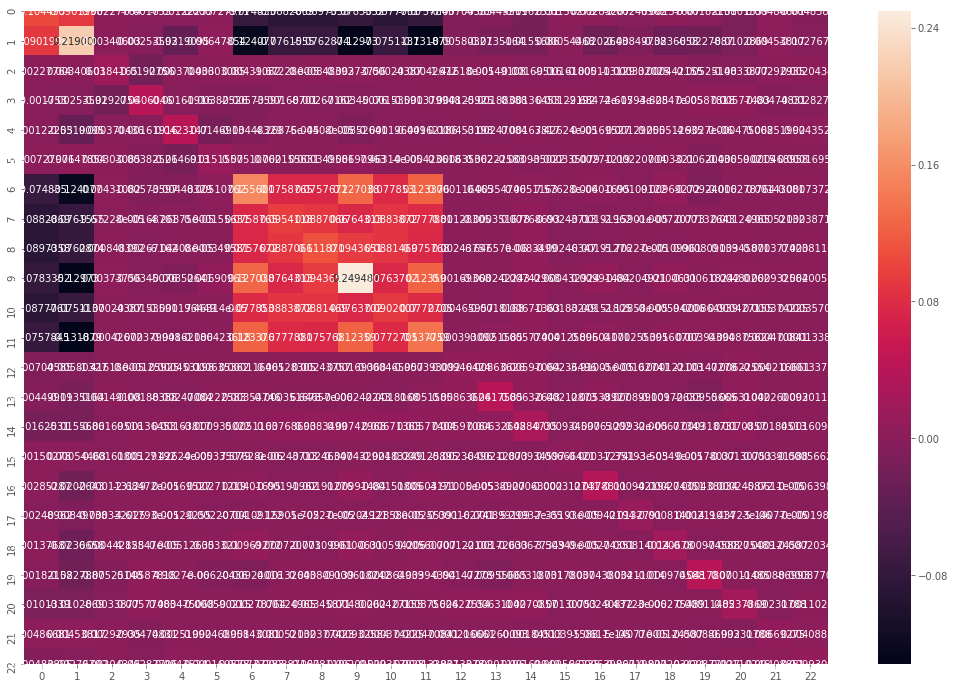

### Diff. LL(beta) ML_9 > ML_10 <- False

***************
***************


### Diff. rho bar square ML_9 > ML_10 <- True

***************
RatioTest 94.68279551836349
Critical 5.991464547107979
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 88.69133097125551

### Probability that ML_9 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:1.3376307788597666e-07
Difference:-0.06999986623692211


#### LogLikelihood ML_10 - BenAkivaSwaitHorowitzTest ML_9

#### LogLikelihood TEST ML_10 disagrees with BenAkivaSwaitHorowitzTest ML_9

### TRY  CROSS VALIDATION

# Perform  Cross Validation Between ['ML_10', 'ML_9']

Model 0
Fold 0
Model 0
Fold 1
Model 0
Fold 2
Model 0
Fold 3
Model 0
Fold 4
Model 1
Fold 0
Model 1
Fold 1
Model 1
Fold 2
Model 1
Fold 3
Model 1
Fold 4
loglikelihood model ML_10: -1567.2796620833853 +/- 31.018305784157565
loglikelihood model ML_9: -1572.5112488437276 +/- 34.23822372150661


## Accept ML_10 performs better off the sample

# -----

# ML_11  NEXT MODEL

In [26]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [27]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + B_TIME_SM       * SM_TT_SCALED   \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + BETA_TIME_CAR_random_Norm * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_11

## Estimate  ML_11 and compare with ML_10

#### Unrestricted model ML_11 and Restricted model ML_10

# Results model ML_11

                              Value   Std err     t-test       p-value
ASC_SM                    -1.934589  0.564657  -3.426132  6.122424e-04
ASC_TRAIN                 -0.832022  0.648500  -1.282995  1.994937e-01
BETA_COST_mean_Norm       -5.102038  0.246368 -20.708975  0.000000e+00
BETA_COST_std_Norm         3.736340  0.209055  17.872534  0.000000e+00
BETA_HE_mean_Norm         -1.439909  0.235683  -6.109528  9.992622e-10
BETA_HE_std_Norm           1.490401  0.300238   4.964058  6.903515e-07
BETA_TIME_CAR_mean_Norm   -4.892265  0.197839 -24.728503  0.000000e+00
BETA_TIME_CAR_std_Norm     2.494343  0.104820  23.796388  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -4.626614  0.205377 -22.527444  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.714376  0.114904  14.920018  0.000000e+00
B_AGE_3_TRAIN             -2.357425  0.568920  -4.143684  3.417703e-05
B_AGE_4_SM                -1.589967  0.506278  -3.140501  1.686590e-03
B_AGE_5_SM                -1.780153  0.591674  -3.008671  2.623930e-03
B_AGE_

# Variance Covariance Matrix

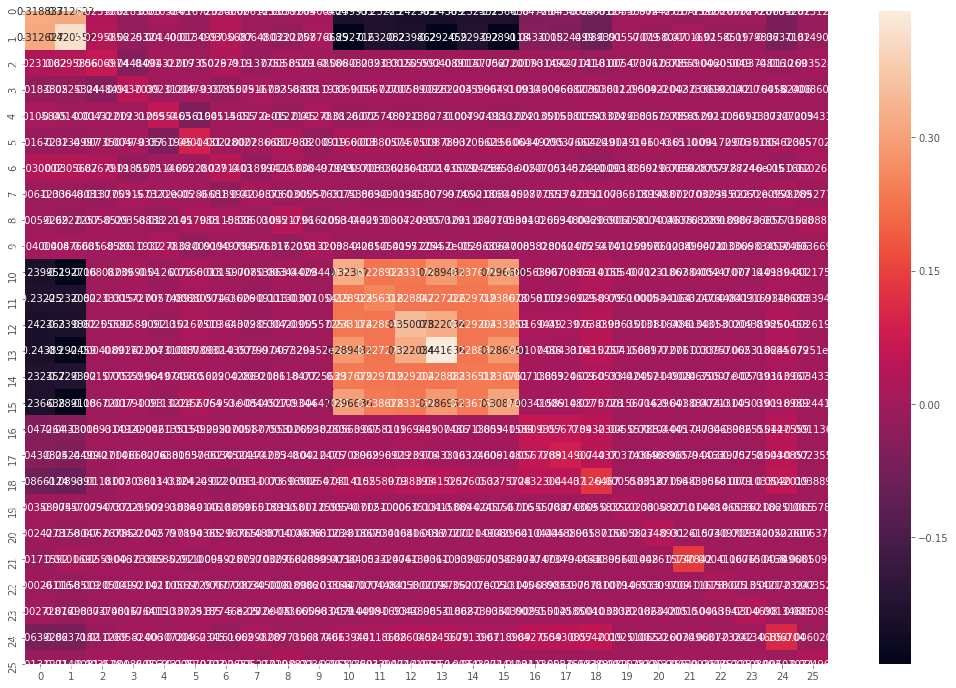

# Results model ML_10

                              Value   Std err     t-test       p-value
ASC_SM                    -0.060972  0.335576  -0.181692  8.558243e-01
ASC_TRAIN                  1.314147  0.483647   2.717161  6.584457e-03
BETA_COST_mean_Norm       -3.392497  0.155292 -21.845930  0.000000e+00
BETA_COST_std_Norm         3.863550  0.169978  22.729671  0.000000e+00
BETA_HE_mean_Norm         -1.822418  0.221862  -8.214200  2.220446e-16
BETA_HE_std_Norm           1.993630  0.220888   9.025515  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -3.298232  0.204042 -16.164446  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.386131  0.089998  15.401822  0.000000e+00
B_AGE_3_TRAIN             -1.867957  0.437057  -4.273943  1.920459e-05
B_AGE_4_SM                -0.975123  0.316740  -3.078620  2.079619e-03
B_AGE_5_SM                -1.233501  0.341480  -3.612214  3.035935e-04
B_AGE_5_TRAIN              0.194177  0.528051   0.367724  7.130790e-01
B_AGE_ADULTS_SM           -0.717587  0.308693  -2.324598  2.009347e-02
B_AGE_

# Variance Covariance Matrix

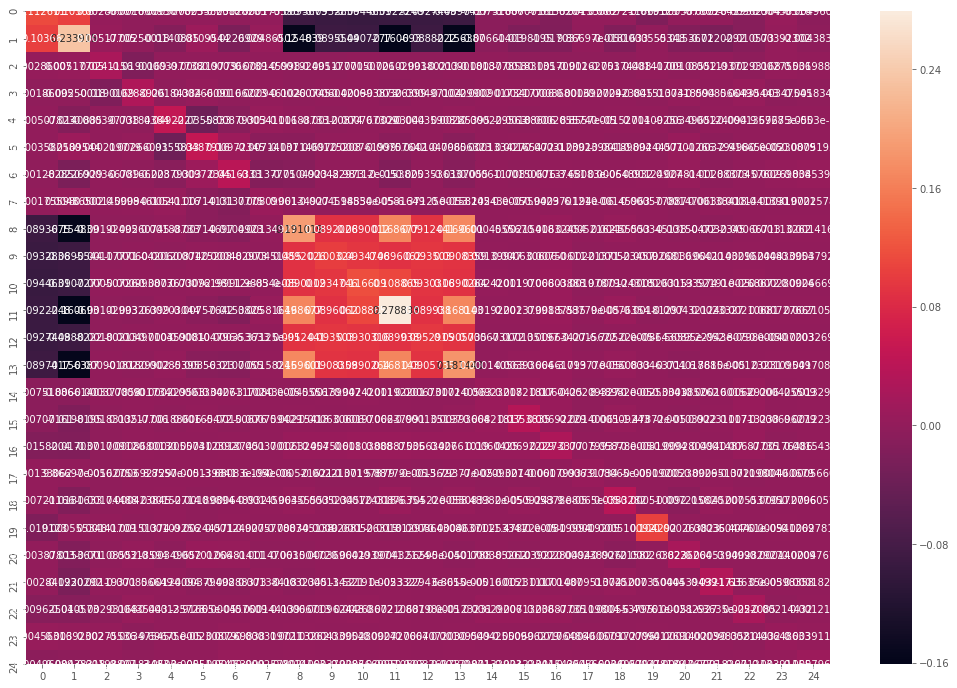

### Diff. LL(beta) ML_10 > ML_11 <- False

***************
***************


### Diff. rho bar square ML_10 > ML_11 <- False

***************
RatioTest 1095.676025328963
Critical 3.841458820694124
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 1091.834566508269

### Probability that ML_11 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:4.51045670838123e-36
Difference:-0.07


#### LogLikelihood ML_11 - BenAkivaSwaitHorowitzTest ML_11

# -----

# ML_12  NEXT MODEL

In [28]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [41]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED**q_TIME \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + B_TIME_SM       * SM_TT_SCALED**q_TIME   \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + BETA_TIME_CAR_random_Norm * CAR_TT_SCALED**q_TIME

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_12

## Estimate  ML_12 and compare with ML_11

#### Unrestricted model ML_12 and Restricted model ML_11

# Results model ML_12

                              Value        Std err         t-test  \
ASC_SM                    -0.123728   4.007970e-01  -3.087060e-01   
ASC_TRAIN                 -0.384676   5.937968e-01  -6.478248e-01   
BETA_COST_mean_Norm       -1.378311  1.797693e+308 -7.667109e-309   
BETA_COST_std_Norm         1.639987  1.797693e+308  9.122733e-309   
BETA_HE_mean_Norm         -0.624238   1.297561e-01  -4.810854e+00   
BETA_HE_std_Norm           1.111822  1.797693e+308  6.184716e-309   
BETA_TIME_CAR_mean_Norm   -0.870944   8.166787e-02  -1.066446e+01   
BETA_TIME_CAR_std_Norm     1.385196   7.180763e-02   1.929038e+01   
BETA_TIME_TRAIN_mean_Norm -1.240385   1.133836e-01  -1.093972e+01   
BETA_TIME_TRAIN_std_Norm   1.645205   1.038163e-01   1.584727e+01   
B_AGE_3_TRAIN             -0.338148   4.429611e-01  -7.633803e-01   
B_AGE_4_SM                -0.064660   3.511404e-01  -1.841417e-01   
B_AGE_5_SM                -0.217912   4.222512e-01  -5.160726e-01   
B_AGE_5_TRAIN              0.16364

# Variance Covariance Matrix

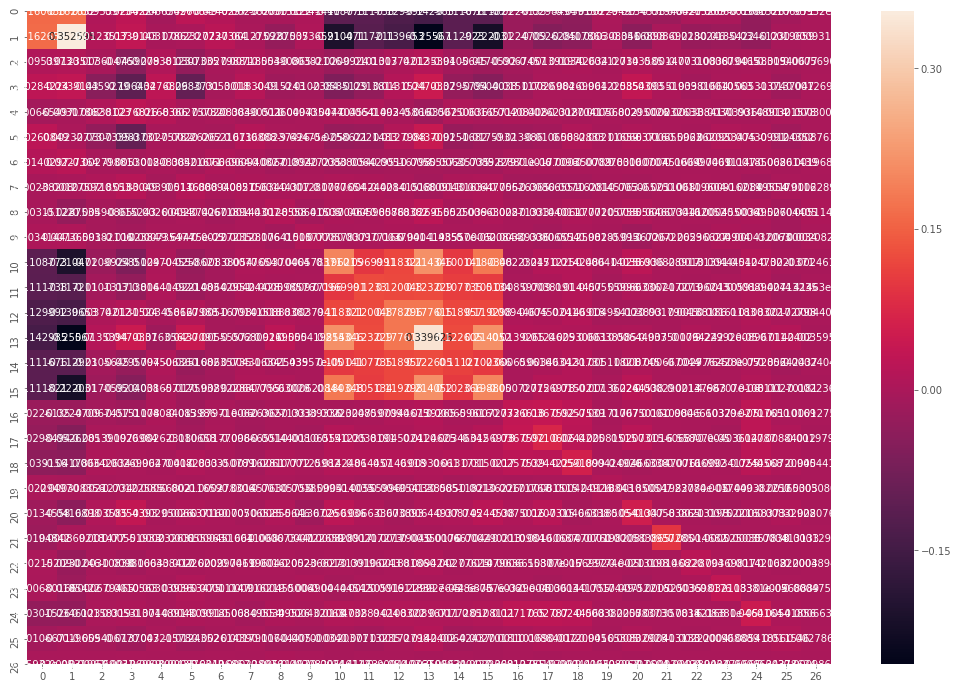

# Results model ML_11

                              Value   Std err     t-test       p-value
ASC_SM                    -1.934589  0.564657  -3.426132  6.122424e-04
ASC_TRAIN                 -0.832022  0.648500  -1.282995  1.994937e-01
BETA_COST_mean_Norm       -5.102038  0.246368 -20.708975  0.000000e+00
BETA_COST_std_Norm         3.736340  0.209055  17.872534  0.000000e+00
BETA_HE_mean_Norm         -1.439909  0.235683  -6.109528  9.992622e-10
BETA_HE_std_Norm           1.490401  0.300238   4.964058  6.903515e-07
BETA_TIME_CAR_mean_Norm   -4.892265  0.197839 -24.728503  0.000000e+00
BETA_TIME_CAR_std_Norm     2.494343  0.104820  23.796388  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -4.626614  0.205377 -22.527444  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.714376  0.114904  14.920018  0.000000e+00
B_AGE_3_TRAIN             -2.357425  0.568920  -4.143684  3.417703e-05
B_AGE_4_SM                -1.589967  0.506278  -3.140501  1.686590e-03
B_AGE_5_SM                -1.780153  0.591674  -3.008671  2.623930e-03
B_AGE_

# Variance Covariance Matrix

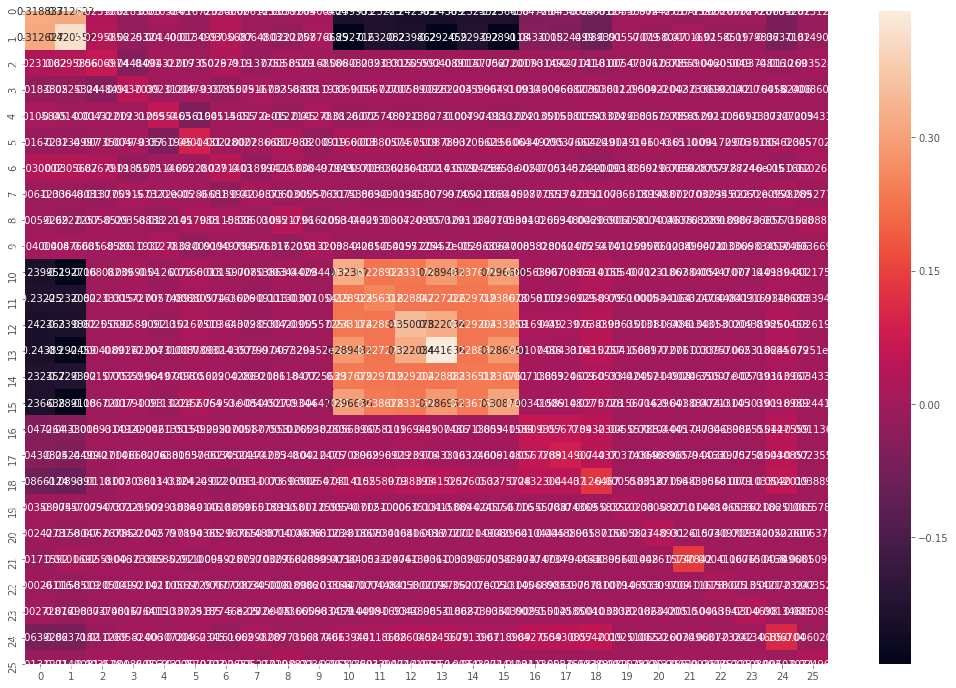

### Diff. LL(beta) ML_11 > ML_12 <- True

***************
***************


### Diff. rho bar square ML_11 > ML_12 <- True

***************
RatioTest 1717.3521415445994
Critical 3.841458820694124
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 1713.5106827239053

### Probability that ML_11 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:0.0
Difference:-0.07


#### LogLikelihood ML_12 - BenAkivaSwaitHorowitzTest ML_11

## ML_12 is NOT identified

# -----

# ML_13  NEXT MODEL

In [42]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [43]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED**q_TIME \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED \
     + BETA_TIME_SM_random_Norm       * SM_TT_SCALED**q_TIME   \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED \
     + BETA_TIME_CAR_random_Norm * CAR_TT_SCALED**q_TIME

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_13

## Estimate  ML_13 and compare with ML_11

#### Unrestricted model ML_13 and Restricted model ML_11

# Results model ML_13

                              Value        Std err         t-test  \
ASC_SM                    -0.091985   3.889811e-01  -2.364773e-01   
ASC_TRAIN                 -0.394301   4.791236e-01  -8.229624e-01   
BETA_COST_mean_Norm       -1.869756   7.834654e-02  -2.386520e+01   
BETA_COST_std_Norm         1.721498   3.165227e-02   5.438782e+01   
BETA_HE_mean_Norm         -0.796055   1.062736e-01  -7.490618e+00   
BETA_HE_std_Norm           1.030229  1.797693e+308  5.730840e-309   
BETA_TIME_CAR_mean_Norm   -1.320294   5.023709e-02  -2.628126e+01   
BETA_TIME_CAR_std_Norm     0.698011  1.797693e+308  3.882814e-309   
BETA_TIME_SM_mean_Norm    -0.539130   1.666400e-01  -3.235296e+00   
BETA_TIME_SM_std_Norm      1.637204   8.205618e-02   1.995223e+01   
BETA_TIME_TRAIN_mean_Norm -1.583879   1.540097e-01  -1.028428e+01   
BETA_TIME_TRAIN_std_Norm   1.775661  1.797693e+308  9.877443e-309   
B_AGE_3_TRAIN             -0.408014   3.892021e-01  -1.048334e+00   
B_AGE_4_SM                -0.04508

# Variance Covariance Matrix

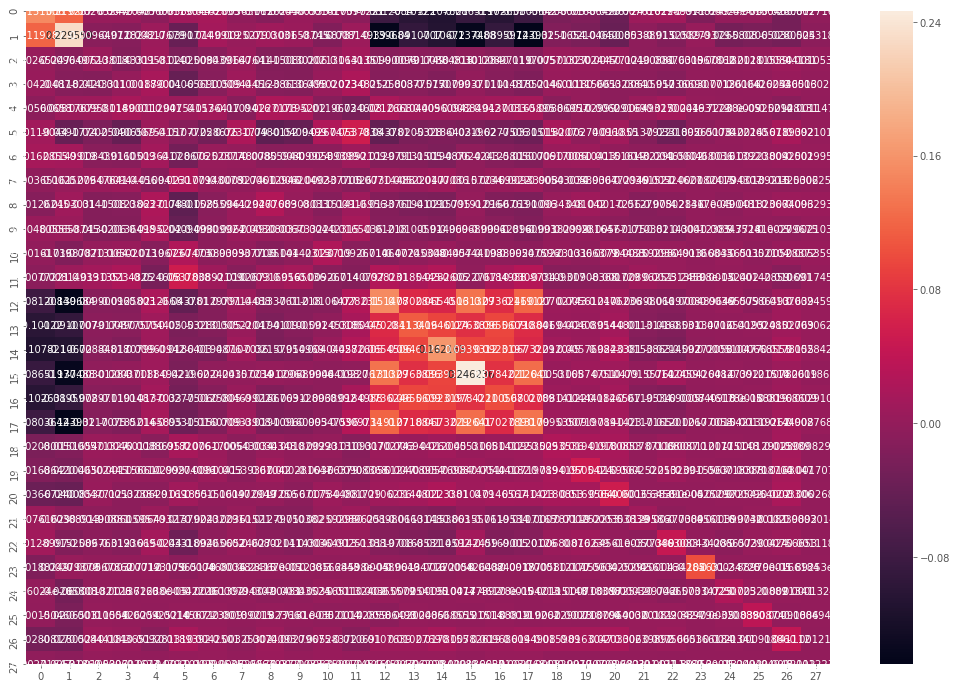

# Results model ML_11

                              Value   Std err     t-test       p-value
ASC_SM                    -1.934589  0.564657  -3.426132  6.122424e-04
ASC_TRAIN                 -0.832022  0.648500  -1.282995  1.994937e-01
BETA_COST_mean_Norm       -5.102038  0.246368 -20.708975  0.000000e+00
BETA_COST_std_Norm         3.736340  0.209055  17.872534  0.000000e+00
BETA_HE_mean_Norm         -1.439909  0.235683  -6.109528  9.992622e-10
BETA_HE_std_Norm           1.490401  0.300238   4.964058  6.903515e-07
BETA_TIME_CAR_mean_Norm   -4.892265  0.197839 -24.728503  0.000000e+00
BETA_TIME_CAR_std_Norm     2.494343  0.104820  23.796388  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -4.626614  0.205377 -22.527444  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.714376  0.114904  14.920018  0.000000e+00
B_AGE_3_TRAIN             -2.357425  0.568920  -4.143684  3.417703e-05
B_AGE_4_SM                -1.589967  0.506278  -3.140501  1.686590e-03
B_AGE_5_SM                -1.780153  0.591674  -3.008671  2.623930e-03
B_AGE_

# Variance Covariance Matrix

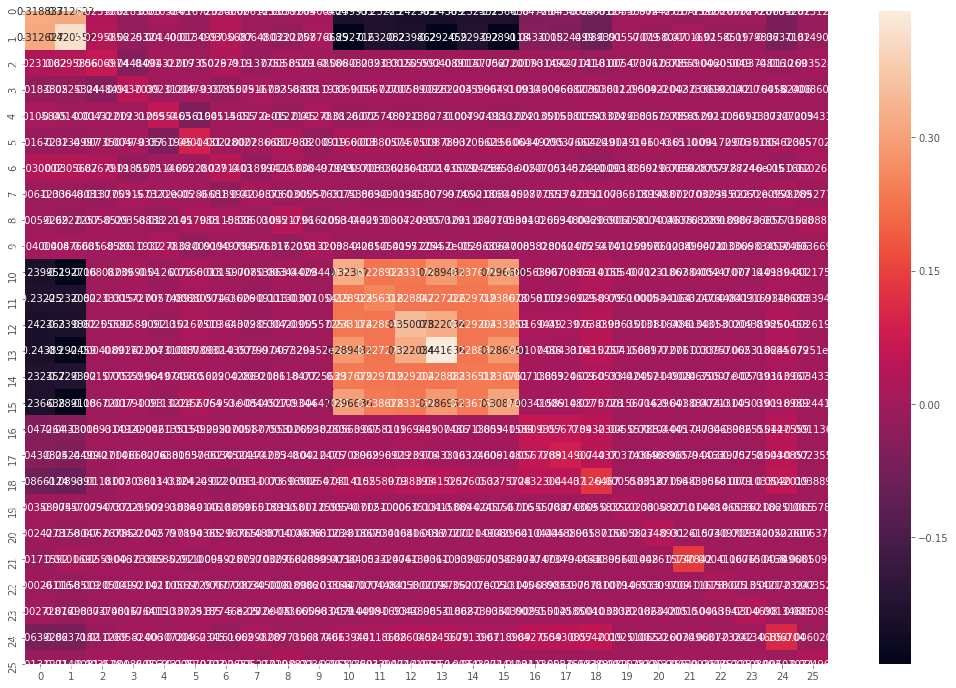

### Diff. LL(beta) ML_11 > ML_13 <- True

***************
***************


### Diff. rho bar square ML_11 > ML_13 <- True

***************
RatioTest 1234.0271481587224
Critical 5.991464547107979
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 1228.0356836116143

### Probability that ML_11 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:0.0
Difference:-0.07


#### LogLikelihood ML_13 - BenAkivaSwaitHorowitzTest ML_11

## ML_13 is NOT identified

# -----

# ML_14  NEXT MODEL

In [44]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [50]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED**q_COST \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED**q_COST \
     + B_TIME_SM       * SM_TT_SCALED \
     + B_HE            * SM_HE_SCALED   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED**q_COST \
     + BETA_TIME_CAR_random_Norm * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_14

## Estimate  ML_14 and compare with ML_11

#### Unrestricted model ML_14 and Restricted model ML_11

# Results model ML_14

                               Value   Std err     t-test       p-value
ASC_SM                      0.139705  0.533336   0.261946  7.933631e-01
ASC_TRAIN                   0.563914  0.585378   0.963332  3.353810e-01
BETA_COST_mean_Norm       -12.335292  1.304947  -9.452713  0.000000e+00
BETA_COST_std_Norm         11.848273  1.146357  10.335587  0.000000e+00
BETA_HE_mean_Norm          -1.439567  0.163493  -8.805049  0.000000e+00
BETA_HE_std_Norm            1.474043  0.153477   9.604323  0.000000e+00
BETA_TIME_CAR_mean_Norm    -5.280735  0.213735 -24.706984  0.000000e+00
BETA_TIME_CAR_std_Norm      2.404089  0.099175  24.240945  0.000000e+00
BETA_TIME_TRAIN_mean_Norm  -4.324304  0.194949 -22.181774  0.000000e+00
BETA_TIME_TRAIN_std_Norm    1.712836  0.083138  20.602340  0.000000e+00
B_AGE_3_TRAIN              -4.286769  0.536161  -7.995302  1.332268e-15
B_AGE_4_SM                 -3.531386  0.500057  -7.061973  1.641576e-12
B_AGE_5_SM                 -3.099133  0.585355  -5.294447  1.193

# Variance Covariance Matrix

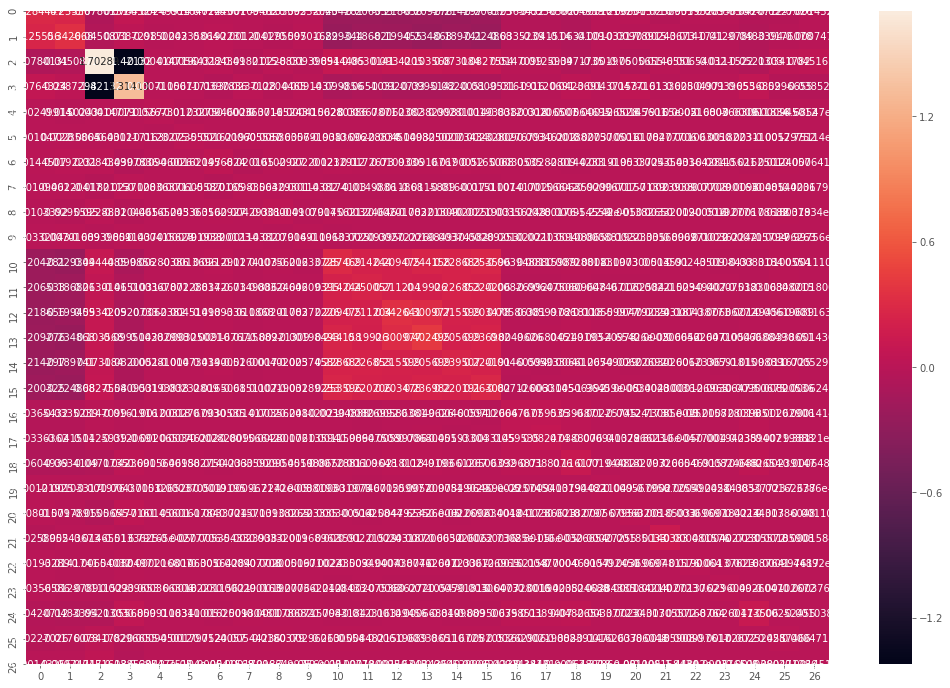

# Results model ML_11

                              Value   Std err     t-test       p-value
ASC_SM                    -1.934589  0.564657  -3.426132  6.122424e-04
ASC_TRAIN                 -0.832022  0.648500  -1.282995  1.994937e-01
BETA_COST_mean_Norm       -5.102038  0.246368 -20.708975  0.000000e+00
BETA_COST_std_Norm         3.736340  0.209055  17.872534  0.000000e+00
BETA_HE_mean_Norm         -1.439909  0.235683  -6.109528  9.992622e-10
BETA_HE_std_Norm           1.490401  0.300238   4.964058  6.903515e-07
BETA_TIME_CAR_mean_Norm   -4.892265  0.197839 -24.728503  0.000000e+00
BETA_TIME_CAR_std_Norm     2.494343  0.104820  23.796388  0.000000e+00
BETA_TIME_TRAIN_mean_Norm -4.626614  0.205377 -22.527444  0.000000e+00
BETA_TIME_TRAIN_std_Norm   1.714376  0.114904  14.920018  0.000000e+00
B_AGE_3_TRAIN             -2.357425  0.568920  -4.143684  3.417703e-05
B_AGE_4_SM                -1.589967  0.506278  -3.140501  1.686590e-03
B_AGE_5_SM                -1.780153  0.591674  -3.008671  2.623930e-03
B_AGE_

# Variance Covariance Matrix

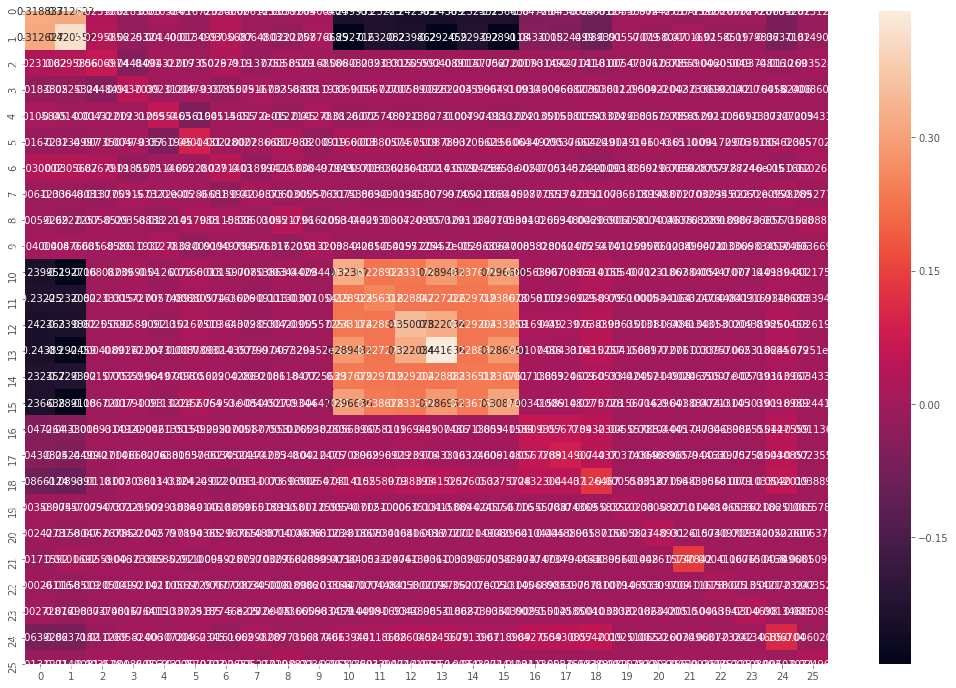

### Diff. LL(beta) ML_11 > ML_14 <- False

***************
***************


### Diff. rho bar square ML_11 > ML_14 <- False

***************
RatioTest 157.91612575017643
Critical 3.841458820694124
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 154.0746669294823

### Probability that ML_14 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:8.480848899711481e-44
Difference:-0.07


#### LogLikelihood ML_14 - BenAkivaSwaitHorowitzTest ML_14

# -----

# ML_15  NEXT MODEL

In [51]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [52]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED**q_COST \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED**q_HE \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED**q_COST \
     + B_TIME_SM       * SM_TT_SCALED \
     + B_HE            * SM_HE_SCALED**q_HE   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED**q_COST \
     + BETA_TIME_CAR_random_Norm * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_15

## Estimate  ML_15 and compare with ML_14

#### Unrestricted model ML_15 and Restricted model ML_14

# Results model ML_15

                               Value   Std err     t-test       p-value
ASC_SM                     -1.029311  1.588943  -0.647796  5.171170e-01
ASC_TRAIN                   1.922439  2.647584   0.726111  4.677710e-01
BETA_COST_mean_Norm       -13.472633  1.311144 -10.275477  0.000000e+00
BETA_COST_std_Norm          9.718265  0.875724  11.097406  0.000000e+00
BETA_HE_mean_Norm          -7.588297  2.534906  -2.993522  2.757774e-03
BETA_HE_std_Norm            2.744509  0.151148  18.157736  0.000000e+00
BETA_TIME_CAR_mean_Norm    -5.126413  0.209424 -24.478668  0.000000e+00
BETA_TIME_CAR_std_Norm      2.746925  0.118911  23.100776  0.000000e+00
BETA_TIME_TRAIN_mean_Norm  -2.721199  0.153951 -17.675693  0.000000e+00
BETA_TIME_TRAIN_std_Norm    0.285454  0.110586   2.581297  9.843000e-03
B_AGE_3_TRAIN              -1.000767  0.594393  -1.683679  9.224363e-02
B_AGE_4_SM                 -0.239269  0.536603  -0.445896  6.556722e-01
B_AGE_5_SM                  0.498133  0.617911   0.806158  4.201

# Variance Covariance Matrix

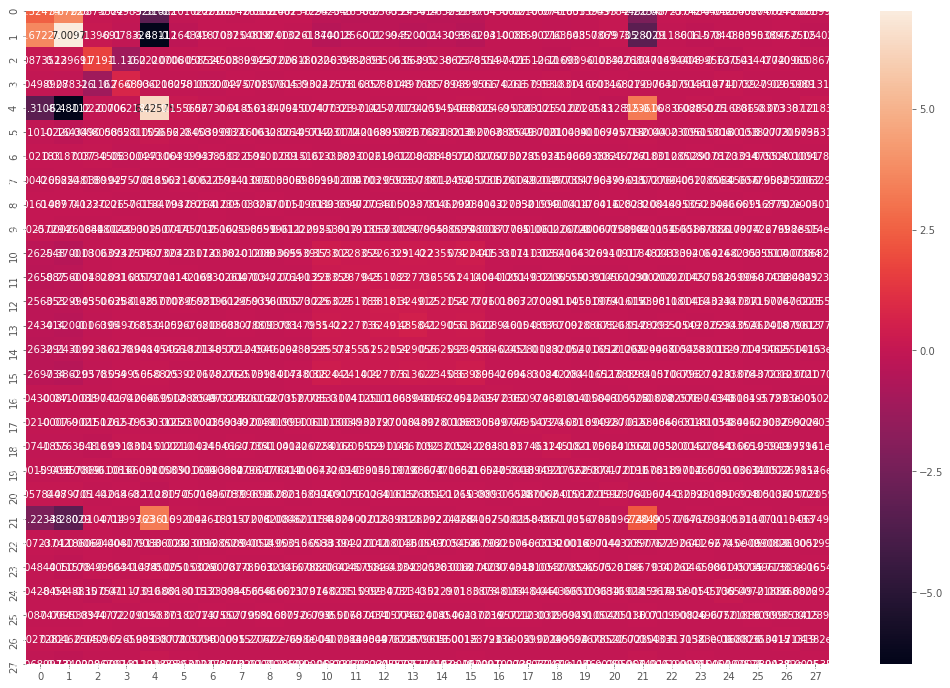

# Results model ML_14

                               Value   Std err     t-test       p-value
ASC_SM                      0.139705  0.533336   0.261946  7.933631e-01
ASC_TRAIN                   0.563914  0.585378   0.963332  3.353810e-01
BETA_COST_mean_Norm       -12.335292  1.304947  -9.452713  0.000000e+00
BETA_COST_std_Norm         11.848273  1.146357  10.335587  0.000000e+00
BETA_HE_mean_Norm          -1.439567  0.163493  -8.805049  0.000000e+00
BETA_HE_std_Norm            1.474043  0.153477   9.604323  0.000000e+00
BETA_TIME_CAR_mean_Norm    -5.280735  0.213735 -24.706984  0.000000e+00
BETA_TIME_CAR_std_Norm      2.404089  0.099175  24.240945  0.000000e+00
BETA_TIME_TRAIN_mean_Norm  -4.324304  0.194949 -22.181774  0.000000e+00
BETA_TIME_TRAIN_std_Norm    1.712836  0.083138  20.602340  0.000000e+00
B_AGE_3_TRAIN              -4.286769  0.536161  -7.995302  1.332268e-15
B_AGE_4_SM                 -3.531386  0.500057  -7.061973  1.641576e-12
B_AGE_5_SM                 -3.099133  0.585355  -5.294447  1.193

# Variance Covariance Matrix

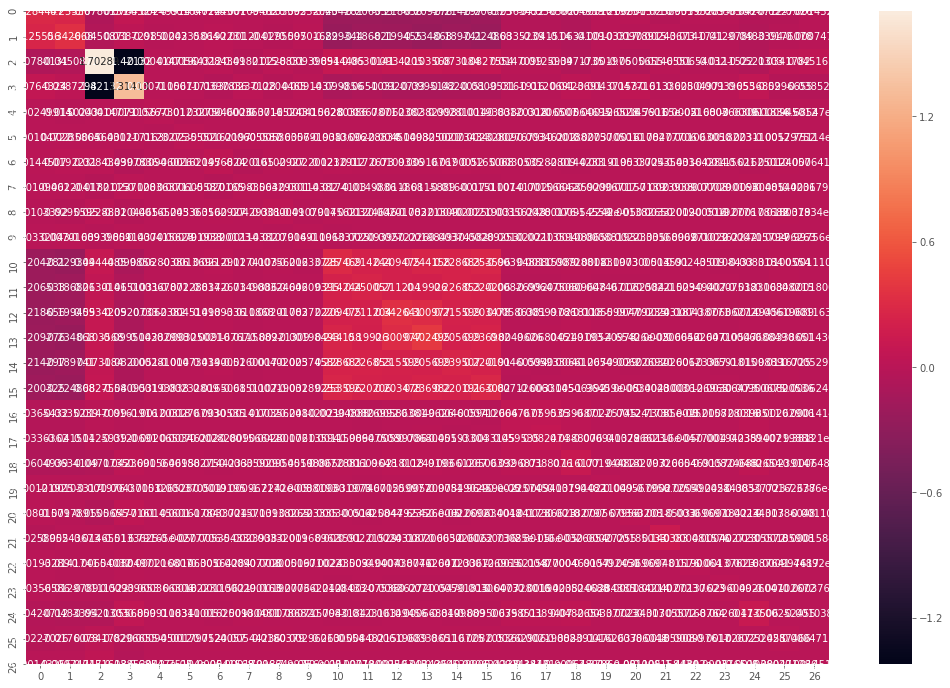

### Diff. LL(beta) ML_14 > ML_15 <- True

***************
***************


### Diff. rho bar square ML_14 > ML_15 <- True

***************
RatioTest 48.93298366876843
Critical 3.841458820694124
Chose Unrestricted (reject H0 the parameters of the unrestricted model are 0)


### LL Ratio Test Result (abs(STAT)-CHI2): 45.09152484807431

### Probability that ML_14 is false having greater rho bar squere, is below threshold:
Threshold:0.07
Probability:6.258037734812607e-08
Difference:-0.06999993741962265


#### LogLikelihood ML_15 - BenAkivaSwaitHorowitzTest ML_14

#### LogLikelihood TEST ML_15 disagrees with BenAkivaSwaitHorowitzTest ML_14

### TRY  CROSS VALIDATION

# Perform  Cross Validation Between ['ML_15', 'ML_14']

Model 0
Fold 0
Model 0
Fold 1
Model 0
Fold 2
Model 0
Fold 3
Model 0
Fold 4
Model 1
Fold 0
Model 1
Fold 1
Model 1
Fold 2
Model 1
Fold 3
Model 1
Fold 4
loglikelihood model ML_15: -1561.2692630898175 +/- 40.215828572830496
loglikelihood model ML_14: -1575.2122663152918 +/- 46.40774879944387


## Accept ML_15 performs better off the sample

# -----

# ML_16  NEXT MODEL

In [53]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=100
                               )
best.append(bestRes)

In [54]:
#Utility functions
TRAIN_SP = ASC_TRAIN \
     + BETA_COST_random_Norm             * TRAIN_COST_SCALED**q_COST \
     + BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED \
     + BETA_HE_random_Norm               * TRAIN_HE_SCALED**q_HE \
     + B_AGE_ADULTS_TRAIN * AGE_2 \
     + B_AGE_3_TRAIN      * AGE_3 \
     + B_AGE_ADULTS_TRAIN * AGE_4 \
     + B_AGE_5_TRAIN      * AGE_5 \
     + B_LUGGAGE_TRAIN    * LUGGAGE \
     + B_MALE_TRAIN       * MALE \
     + B_GA_TRAIN         * GA \
     + B_BUSINESS_TRAIN   * BUSINESS \
     + B_PRIVATE          * PRIVATE  \
     + B_COMMUTER         * COMMUTER

SM_SP = ASC_SM \
     + BETA_COST_random_Norm * SM_COST_SCALED**q_COST \
     + B_TIME_SM       * SM_TT_SCALED \
     + B_HE            * SM_HE_SCALED**q_HE   \
     + B_AGE_ADULTS_SM * AGE_2 \
     + B_AGE_ADULTS_SM * AGE_3 \
     + B_AGE_4_SM      * AGE_4 \
     + B_AGE_5_SM      * AGE_5 \
     + B_FIRST_SM      * FIRST \
     + B_BUSINESS_SM   * BUSINESS \
     + B_PRIVATE       * PRIVATE \
     + B_COMMUTER      * COMMUTER

Car_SP = ASC_CAR \
     + BETA_COST_random_Norm     * CAR_COST_SCALED**q_COST \
     + BETA_TIME_CAR_random_Norm * CAR_TT_SCALED

V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}

vSeq.append(V)
ModNameSeqence.append("ML_"+str(len(vSeq)))
display(Markdown(f"# ^^^^^^^^^^^"))
display(Markdown(f"# {ModNameSeqence[-1]}"))

# ^^^^^^^^^^^

# ML_16

In [ ]:
bestRes, results = estimate_N_compare(ModNameSeqence[-1]
                               , bestRes
                               , vSeq
                               , av
                               , CHOICE, Car_SP, TRAIN_SP, SM_SP, CAR_AV_SP, TRAIN_AV_SP, SM_AV
                               , database
                               , pandas
                               , myRandomNumberGenerators
                               , results
                               , ModNameSeqence=ModNameSeqence
                               , Draws=2000
                               , cross_validate=False)
best.append(bestRes)

## Estimate  ML_16 and compare with ML_15

In [49]:
print(len(ModNameSeqence),len(best)+1,len(results), len(vSeq))

13 13 13 13


In [ ]:
parN = []
LL = []
robar2 = []

for j,m in enumerate(ModNameSeqence):
    #best.append(estimate_N_compare(m, best[-1], ModNameSeqence=ModNameSeqence, threshold=0.07, testOnly=True))
    
    i = ModNameSeqence.index(best[j])
    
    LL.append(results[i].data.logLike)
    parN.append(len(results[i].data.betaNames))
    robar2.append(results[i].data.rhoBarSquare)

In [ ]:
"""
=======================
Plot 2D data on 3D plot
=======================

Demonstrates using ax.plot's zdir keyword to plot 2D data on
selective axes of a 3D plot.
"""

from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm


fig = plt.figure()
ax = fig.gca(projection='3d')
font_size = 18
# Plot a sin curve using the x and y axes.
x = np.array(parN)
y = np.array(LL)
z = np.array(robar2)
label = np.array(best[1:])
ax.plot(x, y, z, zdir='z', linewidth=4, markersize=12, marker='o', label='Best Model Path')

for label, x, y, z in zip(label, x, y, z):
    ax.text(x, y, z, label, fontsize=font_size)

x = [len(results[i].data.betaNames) for i in range(len(results))]
y = np.array([results[i].data.logLike for i in range(len(results))])
z = np.array([results[i].data.rhoBarSquare for i in range(len(results))])
label = np.array(ModNameSeqence)
ax.plot(x, y, z, '--', zdir='z', linewidth=2, markersize=12, marker='x', label='Model Testing')

for label, x, y, z in zip(label, x, y, z):
    ax.text(x, y, z, label, fontsize=font_size)
# Make legend, set axes limits and labels
ax.legend(fontsize=font_size)
# Make legend, set axes limits and labels
#ax.set_xlim(0, 1)
#ax.set_ylim(0, 1)
#ax.set_zlim(0, 1)
ax.set_xlabel('Number of Parameters', fontsize=font_size)
ax.set_ylabel('Log Likelihood', fontsize=font_size)
ax.set_zlabel('ro bar square', fontsize=font_size)

# Customize the view angle so it's easier to see that the scatter points lie
# on the plane y=0
#ax.view_init(elev=20., azim=-35)
plt.savefig('MLPanel.png', dpi=300)
plt.show()

In [ ]:
# Function that calculates the market shares for SM for a given scaling of the cost

def scenario(HEvalue, costScale, database, pickShare,  draws=100):
    '''
    ...#costScale includes the variability of cost
    ...#HEvalue the simulations on different HE values
    ...#To test HE effect in conditions similar to Train, 
    ...#we put SM_TT_SCALED = TRAIN_TT_SCALED
    '''
    share = {'CAR': 3,'TRAIN': 1,'SM': 2}
    scale = pandas['SM_HE_SCALED'][0]/pandas['SM_HE'][0]
    
    #Utility functions
    TRAIN_SP = ASC_TRAIN                                      + \
     BETA_COST_random             * (TRAIN_COST_SCALED * costScale)**q_COST + \
     BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED**q_TIME   + \
     BETA_HE_random_Norm               * pandas['TRAIN_HE_SCALED'].min()**q_HE           + \
     B_AGE_ADULTS_TRAIN * AGE_2                     + \
     B_AGE_3_TRAIN      * AGE_3                     + \
     B_AGE_ADULTS_TRAIN * AGE_4                     + \
     B_AGE_5_TRAIN      * AGE_5                     + \
     B_LUGGAGE_TRAIN    * LUGGAGE                   + \
     B_MALE_TRAIN       * MALE                      + \
     B_GA_TRAIN         * GA                        + \
     B_BUSINESS_TRAIN   * BUSINESS                  + \
     B_PRIVATE          * PRIVATE                   + \
     B_COMMUTER         * COMMUTER
    
    
    SM_SP = ASC_SM                                   + \
         BETA_COST_random * (SM_COST_SCALED * costScale)**q_COST + \
         BETA_TIME_SM_random       * SM_TT_SCALED**q_TIME        + \
         BETA_HE_random_Norm            * pandas['SM_HE_SCALED'].min()**q_HE  + \
         B_AGE_ADULTS_SM * AGE_2                  + \
         B_AGE_ADULTS_SM * AGE_3                  + \
         B_AGE_4_SM      * AGE_4                  + \
         B_AGE_5_SM      * AGE_5                  + \
         B_FIRST_SM      * FIRST                  + \
         B_BUSINESS_SM   * BUSINESS               + \
         B_PRIVATE       * PRIVATE                + \
         B_COMMUTER      * COMMUTER
    '''
    TRAIN_SP = ASC_TRAIN                                      + \
     BETA_COST_random             * (TRAIN_COST_SCALED * costScale)**q_COST + \
     BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED**q_TIME   + \
     BETA_HE_random_Norm               * (HEvalue*scale)**q_HE           + \
     B_AGE_ADULTS_TRAIN * AGE_2                     + \
     B_AGE_3_TRAIN      * AGE_3                     + \
     B_AGE_ADULTS_TRAIN * AGE_4                     + \
     B_AGE_5_TRAIN      * AGE_5                     + \
     B_LUGGAGE_TRAIN    * LUGGAGE                   + \
     B_MALE_TRAIN       * MALE                      + \
     B_GA_TRAIN         * GA                        + \
     B_BUSINESS_TRAIN   * BUSINESS                  + \
     B_PRIVATE          * PRIVATE                   + \
     B_COMMUTER         * COMMUTER
    
    
    SM_SP = ASC_SM                                   + \
         BETA_COST_random * (SM_COST_SCALED * costScale)**q_COST + \
         BETA_TIME_SM_random       * SM_TT_SCALED**q_TIME        + \
         BETA_HE_random_Norm            * (HEvalue*scale)**q_HE  + \
         B_AGE_ADULTS_SM * AGE_2                  + \
         B_AGE_ADULTS_SM * AGE_3                  + \
         B_AGE_4_SM      * AGE_4                  + \
         B_AGE_5_SM      * AGE_5                  + \
         B_FIRST_SM      * FIRST                  + \
         B_BUSINESS_SM   * BUSINESS               + \
         B_PRIVATE       * PRIVATE                + \
         B_COMMUTER      * COMMUTER
    '''
    V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
    av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}
    
    #Lets Look at CARs market share
    prob_SM = models.logit(V,av,share[pickShare])
    
    MCprob = MonteCarlo(prob_SM)
    
    simulate = {'Prob. SM': MCprob}
    
    biosim  = bio.BIOGEME(database,simulate,numberOfDraws=draws)
    
    biosim.modelName = f"marketShares_SM_HE_"+pickShare+"_NO_PANEL"
    
    simresults = biosim.simulate(results[-1].data.betaValues)
    
    return simresults['Prob. SM'].mean()

In [ ]:
# Duplicate the database
#database_young = db.Database("young",pandas[pandas['AGE'] == 1].copy())
database_middelage = db.Database("middelage",pandas[(pandas['AGE'] == 1)|(pandas['AGE'] == 2)|(pandas['AGE'] == 3)].copy())
database_senior = db.Database("senior",pandas[(pandas['AGE'] == 4)|(pandas['AGE'] == 5)].copy())


print(f"Total number of observations: {database.getNumberOfObservations()}")
#print(f"Young                  : {database_young.getNumberOfObservations()}")
print(f"Middle age               : {database_middelage.getNumberOfObservations()}")
print(f"Senior                 : {database_senior.getNumberOfObservations()}")

scales = np.arange(0.8,1.2,0.05)
HEs = np.arange(5,45,5)

shares_mid = [scenario(hhe,s,database_middelage,'CAR') for hhe in HEs for s in scales]
shares_sen = [scenario(hhe,s,database_senior,'CAR') for hhe in HEs for s in scales]

In [ ]:
# Duplicate the database
#database_young = db.Database("young",pandas[pandas['AGE'] == 1].copy())
database_Commuter = db.Database("commuters",pandas[(pandas['PURPOSE'] == 1)].copy())
database_Business = db.Database("business",pandas[(pandas['PURPOSE'] == 3)].copy())
database_Others = db.Database("business",pandas[(pandas['PURPOSE'] == 2)|(pandas['PURPOSE'] == 4)].copy())


print(f"Total number of observations: {database.getNumberOfObservations()}")
#print(f"Young                  : {database_young.getNumberOfObservations()}")
print(f"Commuter               : {database_Commuter.getNumberOfObservations()}")
print(f"Business                 : {database_Business.getNumberOfObservations()}")
print(f"Others                 : {database_Others.getNumberOfObservations()}")

scales = np.arange(0.8,1.2,0.05)
HEs = np.arange(5,45,5)

shares_Commuter = [scenario(hhe,s,database_Commuter,'CAR') for hhe in HEs for s in scales]
shares_Business = [scenario(hhe,s,database_Business,'CAR') for hhe in HEs for s in scales]
shares_Others = [scenario(hhe,s,database_Others,'CAR') for hhe in HEs for s in scales]

In [ ]:
database_ALL = db.Database("ALL",pandas.copy())
shares_ALL = [scenario(hhe,s,database_ALL,'CAR') for hhe in HEs for s in scales]

In [ ]:
# Function that calculates the market shares for SM for a given scaling of the cost

def scenarioHEmM(costScale, database, pickShare,  draws=100, HEmin=True):
    '''
    ...#costScale includes the variability of cost
    ...#HEvalue the simulations on different HE values
    ...#To test HE effect in conditions similar to Train, 
    ...#we put SM_TT_SCALED = TRAIN_TT_SCALED
    '''
    share = {'CAR': 3,'TRAIN': 1,'SM': 2}
    scale = pandas['SM_HE_SCALED'][0]/pandas['SM_HE'][0]
    if HEmin:
        tr_HE_tt_SIM = pandas['TRAIN_HE_SCALED'].min()
        sm_HE_tt_SIM = pandas['SM_HE_SCALED'].min()
    else:
        tr_HE_tt_SIM = pandas['TRAIN_HE_SCALED'].max()
        sm_HE_tt_SIM = pandas['SM_HE_SCALED'].max()
    
    #Utility functions
    TRAIN_SP = ASC_TRAIN                                      + \
         BETA_COST_random             * (TRAIN_COST_SCALED * costScale)**q_COST + \
         BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED**q_TIME   + \
         BETA_HE_random_Norm               * tr_HE_tt_SIM**q_HE           + \
         B_AGE_ADULTS_TRAIN * AGE_2                     + \
         B_AGE_3_TRAIN      * AGE_3                     + \
         B_AGE_ADULTS_TRAIN * AGE_4                     + \
         B_AGE_5_TRAIN      * AGE_5                     + \
         B_LUGGAGE_TRAIN    * LUGGAGE                   + \
         B_MALE_TRAIN       * MALE                      + \
         B_GA_TRAIN         * GA                        + \
         B_BUSINESS_TRAIN   * BUSINESS                  + \
         B_PRIVATE          * PRIVATE                   + \
         B_COMMUTER         * COMMUTER
    
    
    SM_SP = ASC_SM                                   + \
         BETA_COST_random * (SM_COST_SCALED * costScale)**q_COST + \
         BETA_TIME_SM_random       * SM_TT_SCALED**q_TIME        + \
         BETA_HE_random_Norm            * sm_HE_tt_SIM**q_HE  + \
         B_AGE_ADULTS_SM * AGE_2                  + \
         B_AGE_ADULTS_SM * AGE_3                  + \
         B_AGE_4_SM      * AGE_4                  + \
         B_AGE_5_SM      * AGE_5                  + \
         B_FIRST_SM      * FIRST                  + \
         B_BUSINESS_SM   * BUSINESS               + \
         B_PRIVATE       * PRIVATE                + \
         B_COMMUTER      * COMMUTER
    '''
    TRAIN_SP = ASC_TRAIN                                      + \
     BETA_COST_random             * (TRAIN_COST_SCALED * costScale)**q_COST + \
     BETA_TIME_TRAIN_random_Norm       * TRAIN_TT_SCALED**q_TIME   + \
     BETA_HE_random_Norm               * (HEvalue*scale)**q_HE           + \
     B_AGE_ADULTS_TRAIN * AGE_2                     + \
     B_AGE_3_TRAIN      * AGE_3                     + \
     B_AGE_ADULTS_TRAIN * AGE_4                     + \
     B_AGE_5_TRAIN      * AGE_5                     + \
     B_LUGGAGE_TRAIN    * LUGGAGE                   + \
     B_MALE_TRAIN       * MALE                      + \
     B_GA_TRAIN         * GA                        + \
     B_BUSINESS_TRAIN   * BUSINESS                  + \
     B_PRIVATE          * PRIVATE                   + \
     B_COMMUTER         * COMMUTER
    
    
    SM_SP = ASC_SM                                   + \
         BETA_COST_random * (SM_COST_SCALED * costScale)**q_COST + \
         BETA_TIME_SM_random       * SM_TT_SCALED**q_TIME        + \
         BETA_HE_random_Norm            * (HEvalue*scale)**q_HE  + \
         B_AGE_ADULTS_SM * AGE_2                  + \
         B_AGE_ADULTS_SM * AGE_3                  + \
         B_AGE_4_SM      * AGE_4                  + \
         B_AGE_5_SM      * AGE_5                  + \
         B_FIRST_SM      * FIRST                  + \
         B_BUSINESS_SM   * BUSINESS               + \
         B_PRIVATE       * PRIVATE                + \
         B_COMMUTER      * COMMUTER
    '''
    V = {3: Car_SP,1: TRAIN_SP,2: SM_SP}
    av = {3: CAR_AV_SP,1: TRAIN_AV_SP,2: SM_AV}
    
    #Lets Look at CARs market share
    prob_SM = models.logit(V,av,share[pickShare])
    
    MCprob = MonteCarlo(prob_SM)
    
    simulate = {'Prob. SM': MCprob}
    
    biosim  = bio.BIOGEME(database,simulate,numberOfDraws=draws)
    
    biosim.modelName = f"marketShares_SM_HE_"+pickShare+"_NO_PANEL"
    
    simresults = biosim.simulate(results[-1].data.betaValues)
    
    return simresults['Prob. SM'].mean()

In [ ]:
scales = np.arange(0.8,1.2,0.05)
shares_Commuter_m = [scenarioHEmM(s,database_Commuter,'CAR',HEmin=True) for s in scales]
shares_Business_m = [scenarioHEmM(s,database_Business,'CAR',HEmin=True) for s in scales]
shares_Others_m = [scenarioHEmM(s,database_Others,'CAR',HEmin=True) for s in scales]
shares_mid_m = [scenarioHEmM(s,database_middelage,'CAR',HEmin=True) for s in scales]
shares_sen_m = [scenarioHEmM(s,database_senior,'CAR',HEmin=True) for s in scales]
shares_ALL_m = [scenarioHEmM(s,database_ALL,'CAR',HEmin=True) for s in scales]

In [ ]:
shares_Commuter_M = [scenarioHEmM(s,database_Commuter,'CAR',HEmin=False) for s in scales]
shares_Business_M = [scenarioHEmM(s,database_Business,'CAR',HEmin=False) for s in scales]
shares_Others_M = [scenarioHEmM(s,database_Others,'CAR',HEmin=False) for s in scales]
shares_mid_M = [scenarioHEmM(s,database_middelage,'CAR',HEmin=False) for s in scales]
shares_sen_M = [scenarioHEmM(s,database_senior,'CAR',HEmin=False) for s in scales]
shares_ALL_M = [scenarioHEmM(s,database_ALL,'CAR',HEmin=False) for s in scales]

In [ ]:
# plot the data
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.plot(scales, shares_ALL_m, c='g', label='(FULL population) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].min())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].min())+'min')
ax.plot(scales, shares_ALL_M, c='r', label='(FULL population) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].max())+'min and HE SM='+str(int(100*pandas['SM_HE_SCALED'].max()))+'min')
ax.plot(scales, CAR_Market_share*np.ones(len(shares_ALL_m),), c='b', label='(FULL population) market share as from survey results')
plt.axvline(x=1, c='black', label='Cost 100% as from survey results')

ax.set_title('IMPACT of Public Transportation policies ON CAR market share \n HE and cost policy bonduaries for SM and Train \n Effects on full population')
ax.legend(fontsize=12)
ax.set_xlabel('Cost variation on both Public Transport (Train and SM: the actual cost 1=100%)', fontsize=font_size)
ax.set_ylabel('CAR Market Share', fontsize=font_size)
plt.savefig('CARmsImpact-FULLPOP.png', dpi=300)
# display the plot
plt.show()

In [ ]:
senior = pandas['CHOICE'][(pandas['CHOICE']==3) & ((pandas['AGE'] == 4)|(pandas['AGE'] == 5))].count()/pandas['CHOICE'][((pandas['AGE'] == 4)|(pandas['AGE'] == 5))].count()
NON_senior = pandas['CHOICE'][(pandas['CHOICE']==3) & ((pandas['AGE'] == 1)|(pandas['AGE'] == 2)|(pandas['AGE'] == 3))].count()/pandas['CHOICE'][((pandas['AGE'] == 1)|(pandas['AGE'] == 2)|(pandas['AGE'] == 3))].count()
# plot the data
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.plot(scales, np.array(shares_sen_m), c='g', label='(senior) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].min())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].min())+'min')
ax.plot(scales, np.array(shares_sen_M), c='r', label='(senior) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].max())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].max())+'min')
ax.plot(scales, senior*np.ones(len(shares_ALL_m),), c='b', label='(senior) market share as from survey results')

ax.plot(scales, np.array(shares_mid_m), '--', c='g', label='(non senior) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].min())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].min())+'min')
ax.plot(scales, np.array(shares_mid_M), '--', c='r', label='(non senior) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].max())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].max())+'min')
ax.plot(scales, NON_senior*np.ones(len(shares_ALL_m),),'--', c='b', label='(non senior) market share as from survey results')



plt.axvline(x=1, c='black', label='cost 100% as from survey results')

ax.set_title('IMPACT of Public Transportation policies ON CAR market share \n HE and cost policy bonduaries for SM and Train \n effects on Seniors vs Others')
ax.legend(fontsize=12)
ax.set_xlabel('Cost variation on both Public Transport (Train and SM: the actual cost 1=100%)', fontsize=font_size)
ax.set_ylabel('CAR Market Share', fontsize=font_size)
# display the plot
plt.savefig('CARmsImpact-AGE.png', dpi=300)
plt.show()

In [ ]:
Business_MS = pandas['CHOICE'][(pandas['CHOICE']==3) & (pandas['PURPOSE'] == 3)].count()/pandas['CHOICE'][(pandas['PURPOSE'] == 3)].count()
Commuter_MS = pandas['CHOICE'][(pandas['CHOICE']==3) & (pandas['PURPOSE'] == 1)].count()/pandas['CHOICE'][(pandas['PURPOSE'] == 1)].count()
Others_MS = pandas['CHOICE'][(pandas['CHOICE']==3) & ((pandas['PURPOSE'] == 2)|(pandas['PURPOSE'] == 4))].count()/pandas['CHOICE'][((pandas['PURPOSE'] == 2)|(pandas['PURPOSE'] == 4))].count()
# plot the data
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.plot(scales, shares_Commuter_m, c='g', label='(Commuter) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].min())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].min())+'min')
ax.plot(scales, shares_Commuter_M, c='r', label='(Commuter) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].max())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].max())+'min')
ax.plot(scales, Commuter_MS*np.ones(len(shares_ALL_m),), c='b', label='(Commuter) market share as from survey results')


ax.plot(scales, shares_Business_m, '--', c='g', label='(Business) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].min())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].min())+'min')
ax.plot(scales, shares_Business_M, '--', c='r', label='(Business) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].max())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].max())+'min')
ax.plot(scales, Business_MS*np.ones(len(shares_ALL_m),), '--', c='b', label='(Business) market share as from survey results')

ax.plot(scales, shares_Others_m, '*-', c='g', label='(Others) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].min())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].min())+'min')
ax.plot(scales, shares_Others_M, '*-', c='r', label='(Others) constant HE train='+str(100*pandas['TRAIN_HE_SCALED'].max())+'min and HE SM='+str(100*pandas['SM_HE_SCALED'].max())+'min')
ax.plot(scales, Others_MS*np.ones(len(shares_ALL_m),), '*-', c='b', label='(Others) market share as from survey results')


plt.axvline(x=1, c='black', label='cost 100% as from survey results')

ax.set_title('IMPACT of Public Transportation policies ON CAR market share \n HE and cost policy bonduaries for SM and Train \n Effects on Business Vs. Commuters')
ax.legend(fontsize=12)
ax.set_xlabel('Cost variation on both Public Transport (Train and SM: the actual cost 1=100%)', fontsize=font_size)
ax.set_ylabel('CAR Market Share', fontsize=font_size)
# display the plot
plt.savefig('CARmsImpact-PURPOSE.png', dpi=300)
plt.show()

In [ ]:
CAR_Market_share = pandas['CHOICE'][(pandas['CHOICE']==3)].count()/pandas['CHOICE'].count()
print(CAR_Market_share)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

X, Y = np.meshgrid(HEs, scales)
zC = np.array(shares_Commuter)
zB =np.array(shares_Business)
zO =np.array(shares_Others)
zAll =np.array(shares_ALL)

ZC = zC.reshape(X.shape)
ZB = zB.reshape(X.shape)
ZO = zO.reshape(X.shape)
ZAll = zAll.reshape(X.shape)
ZCar0=CAR_Market_share*np.ones(X.shape)

ax.plot_surface(X, Y, ZAll,cmap=cm.coolwarm, rstride=8, cstride=8, alpha=0.01, label='Commuters')
cset = ax.contourf(X, Y, ZAll, zdir='z', offset=0.275, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, ZAll, zdir='x', offset=0,cmap=cm.coolwarm)
cset = ax.contourf(X, Y, ZAll, zdir='y', offset=1.15, cmap=cm.coolwarm)

ax.plot_surface(X, Y, ZCar0,cmap=cm.coolwarm, rstride=8, cstride=8, alpha=0.3, label='Commuters')
#cset = ax.contourf(X, Y, ZCar0, zdir='z', offset=0.275, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, ZCar0, zdir='x', offset=0,cmap=cm.coolwarm)
cset = ax.contourf(X, Y, ZCar0, zdir='y', offset=1.15, cmap=cm.coolwarm)

#ax.plot_surface(X, Y, ZC,cmap=cm.coolwarm, rstride=8, cstride=8, alpha=0.3, label='Commuters')
#cset = ax.contourf(X, Y, ZC, zdir='z', offset=0.24, cmap=cm.coolwarm)
#cset = ax.contourf(X, Y, ZC, zdir='x', offset=0,cmap=cm.coolwarm)
#cset = ax.contourf(X, Y, ZC, zdir='y', offset=1.15, cmap=cm.coolwarm)

#ax.plot_surface(X, Y, ZB, cmap=cm.coolwarm, rstride=8, cstride=8, alpha=0.3, label='Business')
#cset = ax.contourf(X, Y, ZB, zdir='z', offset=0.23, cmap=cm.coolwarm)
#cset = ax.contourf(X, Y, ZB, zdir='x', offset=1,cmap=cm.coolwarm)
#cset = ax.contourf(X, Y, ZB, zdir='y', offset=1.2, cmap=cm.coolwarm)

#ax.plot_surface(X, Y, ZO, cmap=cm.coolwarm, rstride=8, cstride=8, alpha=0.3, label='Others')
#cset = ax.contourf(X, Y, ZO, zdir='z', offset=0.23, cmap=cm.coolwarm)
#cset = ax.contourf(X, Y, ZO, zdir='x', offset=1,cmap=cm.coolwarm)
#cset = ax.contourf(X, Y, ZO, zdir='y', offset=1.2, cmap=cm.coolwarm)

ax.set_xlabel('TRAIN HE minutes')
#ax.set_xlim(0, 45)
ax.set_ylabel('TRAIN Cost')
#ax.set_ylim(0.8, 1.15)
ax.set_zlabel('CAR Market Shares')
#ax.set_zlim(0.24, 0.32)
#plt.savefig('MARKETshareCarPURPOSE-SMtrainEqualTT.png', dpi=300)
plt.show()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

X, Y = np.meshgrid(HEs, scales)
zm = np.array(shares_mid)
zs =np.array(shares_sen)
Zm = zm.reshape(X.shape)
Zs = zs.reshape(X.shape)

ax.plot_surface(X, Y, Zs,cmap=cm.coolwarm, rstride=8, cstride=8, alpha=0.1, label='senior')
cset = ax.contourf(X, Y, Zs, zdir='z', offset=0.355, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Zs, zdir='x', offset=1,cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Zs, zdir='y',offset= 1.18, cmap=cm.coolwarm)

ax.plot_surface(X, Y, Zm, cmap=cm.coolwarm, rstride=8, cstride=8, alpha=0.1, label='middel age and young')
cset = ax.contourf(X, Y, Zm, zdir='z', offset=0.355, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Zm, zdir='x', offset=1, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Zm, zdir='y',offset= 1.18, cmap=cm.coolwarm)

ax.set_xlabel('SM HE minutes')
ax.set_ylabel('SM Cost')
ax.set_zlabel('CAR Market Shares')
#plt.savefig('MARKETshareCarSeniorYoung-SMtrainEqualTT.png', dpi=300)
plt.show()